# Obtaining the cutouts of the plates

In [1]:
import json
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np
import random
import base64
import gzip
import requests
import os

In [2]:
from daschlab import open_session
from pathlib import Path

ra = 244.0
dec = -21.0

session_dir = "dasch_ra245_dec-21b"

sess = (
    open_session(session_dir)
    .select_target(ra_deg=ra, dec_deg=dec)
    .select_refcat("apass")
)

exps = sess.exposures()

hits = exps[
    (exps["series"] == "a") &
    (exps["platenum"] == 3632)
]

if len(hits) == 0:
    raise ValueError("No matching exposure found for plate a03632")

exp = hits[0]

# IMPORTANT: pass the local exposure ID, not the row object
phot = sess.extract(int(exp["local_id"]))

cols = [
    "limiting_mag_local",
    "flux_iso",
    "mag_iso",
    "mag_auto",
    "mag_aper",
    "magcal_iso",
    "magcal_local",
    "magcal_magdep",
    "magcor_local",
    "extinction",
    "magcal_local_rms",
    "magcal_magdep_rms",
    "aflags",
    "bflags",
]

phot[[c for c in cols if c in phot.colnames]]

Opened DASCH session at disk location `dasch_ra245_dec-21b`
- Query target: `16:16:00.0 -21:00:00
- Refcat: 1722 sources from `apass`
- Exposures: 9237 relevant exposures


from erfa import ErfaWarning

 [astropy.utils.exceptions]


limiting_mag_local,flux_iso,mag_iso,mag_auto,mag_aper,magcal_iso,magcal_local,magcal_magdep,magcor_local,extinction,magcal_local_rms,magcal_magdep_rms,aflags,bflags
mag,,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,,
float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,uint32,uint32
17.207052,981866.8,-14.9801,-15.0176,-14.0078,14.863849,14.629653,14.665886,0.00716,0.191,0.122949,0.080333,128,1349453825
17.1992,515509.5,-14.2806,-14.3699,-13.4959,15.962054,15.720006,15.720006,0.00716,0.191,0.076845,--,128,1349451776
17.20349,261904.5,-13.5454,-13.731,-12.9374,16.8405,16.602741,16.602741,0.007187,0.191,0.141861,--,128,1383006208
17.178932,164072.0,-13.0376,-13.1633,-12.5214,17.31247,17.050154,17.050154,0.008916,0.191,0.160377,--,532608,1382940672
17.149769,442485.8,-14.1147,-14.1763,-13.0629,16.190239,15.89876,15.89876,0.040159,0.191,0.079529,--,35127424,1382940674
17.151329,202231.2,-13.2646,-13.4597,-12.5881,17.115288,16.825369,16.825369,0.040159,0.191,0.15882,--,101392512,1382940675
17.152288,181217.0,-13.1455,-13.3848,-12.6815,17.219282,16.930323,16.930323,0.050119,0.191,0.160377,--,532608,1382940672
17.170933,234281.0,-13.4243,-13.5414,-12.8284,16.968115,16.6978,16.6978,0.040159,0.191,0.15882,--,532608,1382940672


In [3]:
phot[['pos']]

pos
"deg,deg"
SkyCoord
"243.819304,-20.975323"
"243.828608,-20.902446"
"243.81588,-20.865483"
"243.840293,-20.835524"
"243.821438,-21.121859"
"243.821159,-21.109335"
"243.835984,-21.065207"
"243.827424,-21.029467"


In [4]:
dfs = phot[[c for c in cols if c in phot.colnames]]
dfs

limiting_mag_local,flux_iso,mag_iso,mag_auto,mag_aper,magcal_iso,magcal_local,magcal_magdep,magcor_local,extinction,magcal_local_rms,magcal_magdep_rms,aflags,bflags
mag,,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,,
float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,uint32,uint32
17.207052,981866.8,-14.9801,-15.0176,-14.0078,14.863849,14.629653,14.665886,0.00716,0.191,0.122949,0.080333,128,1349453825
17.1992,515509.5,-14.2806,-14.3699,-13.4959,15.962054,15.720006,15.720006,0.00716,0.191,0.076845,--,128,1349451776
17.20349,261904.5,-13.5454,-13.731,-12.9374,16.8405,16.602741,16.602741,0.007187,0.191,0.141861,--,128,1383006208
17.178932,164072.0,-13.0376,-13.1633,-12.5214,17.31247,17.050154,17.050154,0.008916,0.191,0.160377,--,532608,1382940672
17.149769,442485.8,-14.1147,-14.1763,-13.0629,16.190239,15.89876,15.89876,0.040159,0.191,0.079529,--,35127424,1382940674
17.151329,202231.2,-13.2646,-13.4597,-12.5881,17.115288,16.825369,16.825369,0.040159,0.191,0.15882,--,101392512,1382940675
17.152288,181217.0,-13.1455,-13.3848,-12.6815,17.219282,16.930323,16.930323,0.050119,0.191,0.160377,--,532608,1382940672
17.170933,234281.0,-13.4243,-13.5414,-12.8284,16.968115,16.6978,16.6978,0.040159,0.191,0.15882,--,532608,1382940672


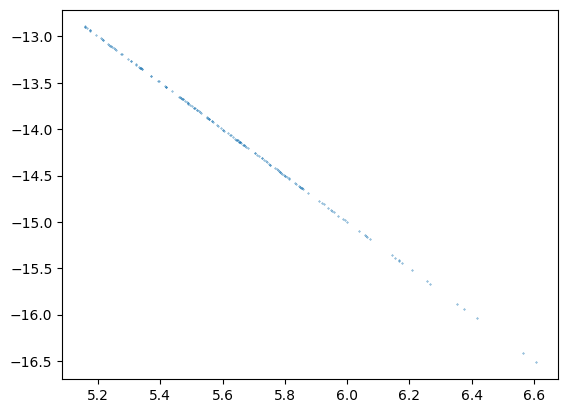

In [6]:
plt.scatter(np.log10(dfs['flux_iso']),dfs['mag_iso'],s=0.1)

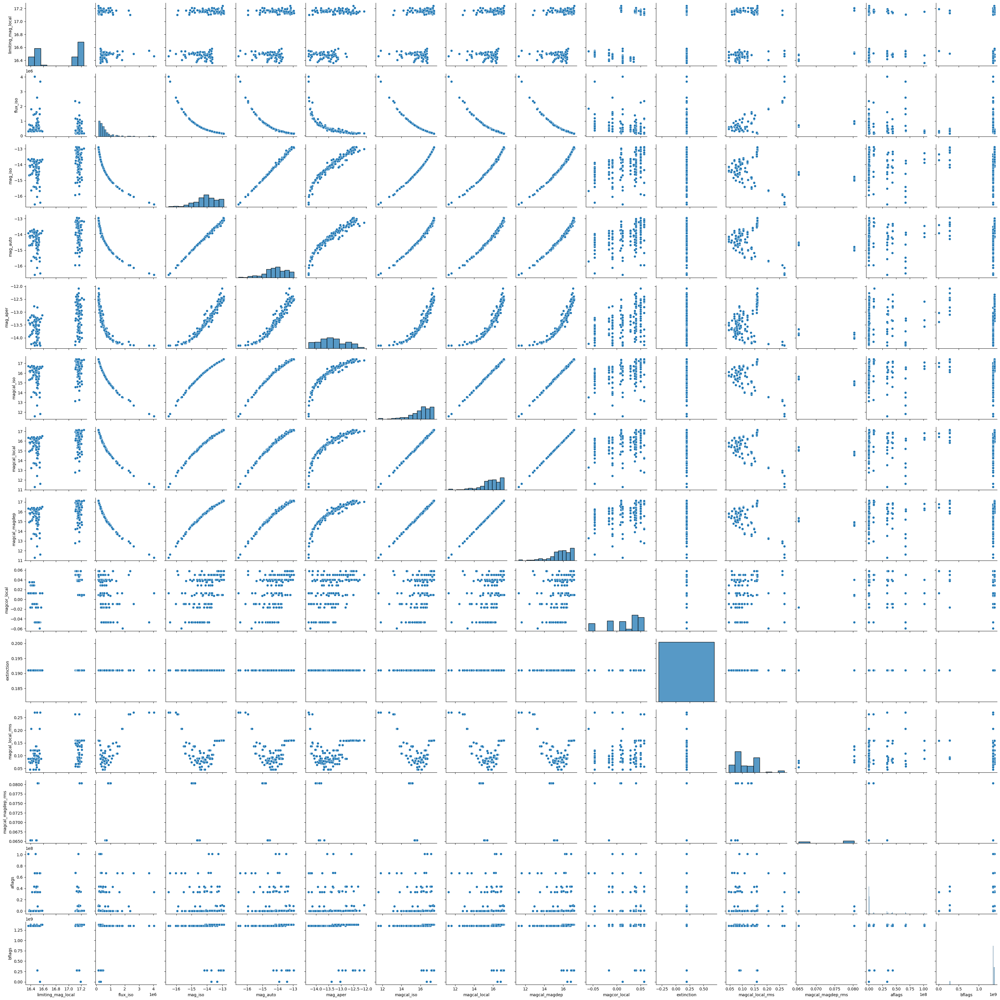

In [5]:
import seaborn as sns

sns.pairplot(dfs.to_pandas())

In [6]:
print(phot.colnames)
print(phot["pos"][:5])

['time', 'local_id', 'ref_number', 'magcal_magdep', 'magcal_magdep_rms', 'limiting_mag_local', 'pos', 'fwhm_world', 'ellipticity', 'theta_j2000', 'iso_area_world', 'aflags', 'bflags', 'local_bin_reject_flag', 'series', 'platenum', 'mosnum', 'solnum', 'expnum', 'image_x', 'image_y', 'magcal_iso', 'magcal_iso_rms', 'magcal_local', 'magcal_local_rms', 'magcal_local_error', 'drad_rms2', 'extinction', 'magcor_local', 'blended_mag', 'a2flags', 'b2flags', 'npoints_local', 'local_bin_index', 'spatial_bin', 'magdep_bin', 'mag_iso', 'mag_aper', 'mag_auto', 'flux_iso', 'background', 'flux_max', 'fwhm_image', 'kron_radius', 'sxt_iso0', 'sxt_iso1', 'sxt_iso2', 'sxt_iso3', 'sxt_iso4', 'sxt_iso5', 'sxt_iso6', 'sxt_iso7', 'time_accuracy', 'catalog_ra', 'catalog_dec', 'pm_ra_cosdec', 'pm_dec', 'plate_dist', 'sxt_number', 'gsc_bin_index', 'dasch_photdb_version_id', 'dasch_mask_index', 'reject', 'exp_local_id']
<SkyCoord (ICRS): (ra, dec) in deg
    [(243.819304, -20.975323), (243.828608, -20.902446),
  

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

def plot_all_radec_grid_maps_magdiffs(
    phot,
    ref_col="mag_iso",
    grid_n=250,
    method="cubic",      # "linear", "nearest", or "cubic"
    invert_ra=True,
    show_points=False,
):
    """
    Interpolate DASCH Extract quantities over an RA/Dec grid.

    Rule:
      - magnitude-valued columns are plotted as: column - ref_col
      - non-magnitude diagnostics are plotted directly

    Parameters
    ----------
    phot : DASCH Extract / astropy Table
        Must contain a SkyCoord column named 'pos'.
    ref_col : str
        Reference magnitude column, usually 'mag_iso'.
    grid_n : int
        Number of grid pixels per axis.
    method : str
        Interpolation method for scipy.interpolate.griddata.
        Use 'linear' by default. 'nearest' fills more area. 'cubic' can overshoot.
    show_points : bool
        Overlay original sample positions.
    """

    if "pos" not in phot.colnames:
        raise ValueError("phot must contain a 'pos' SkyCoord column")

    if ref_col not in phot.colnames:
        raise ValueError(f"{ref_col!r} not found in phot.colnames")

    ra = np.asarray(phot["pos"].ra.deg, dtype=float)
    dec = np.asarray(phot["pos"].dec.deg, dtype=float)
    ref = np.asarray(phot[ref_col], dtype=float)

    magnitude_cols = [
        "mag_aper",
        "mag_auto",
        "magcal_iso",
        "magcal_local",
        "magcal_magdep",
        "blended_mag",
        "limiting_mag_local",
    ]

    direct_cols = [
        "magcor_local",
        "extinction",
        "magcal_iso_rms",
        "magcal_local_rms",
        "magcal_magdep_rms",
        "magcal_local_error",
        "drad_rms2",
        "background",
        "flux_iso",
        "flux_max",
        "fwhm_image",
        "fwhm_world",
        "ellipticity",
        "iso_area_world",
        "kron_radius",
        "npoints_local",
        "plate_dist",
    ]

    magnitude_cols = [c for c in magnitude_cols if c in phot.colnames and c != ref_col]
    direct_cols = [c for c in direct_cols if c in phot.colnames]

    # Build full RA/Dec grid
    ra_grid = np.linspace(np.nanmin(ra), np.nanmax(ra), grid_n)
    dec_grid = np.linspace(np.nanmin(dec), np.nanmax(dec), grid_n)
    RA, DEC = np.meshgrid(ra_grid, dec_grid)

    def plot_one(col, z, label, title):
        good = (
            np.isfinite(ra)
            & np.isfinite(dec)
            & np.isfinite(z)
        )

        if good.sum() < 3:
            print(f"Skipping {title}: fewer than 3 finite points")
            return

        points = np.column_stack([ra[good], dec[good]])
        values = z[good]

        Z = griddata(
            points,
            values,
            (RA, DEC),
            method=method,
        )

        plt.figure(figsize=(8, 6))

        im = plt.imshow(
            Z,
            origin="lower",
            extent=[
                np.nanmin(ra),
                np.nanmax(ra),
                np.nanmin(dec),
                np.nanmax(dec),
            ],
            aspect="auto",
        )

        if show_points:
            plt.scatter(
                ra[good],
                dec[good],
                s=4,
                alpha=0.35,
                c="k",
            )

        plt.colorbar(im, label=label)
        plt.xlabel("RA [deg]")
        plt.ylabel("Dec [deg]")
        plt.title(title)

        if invert_ra:
            plt.gca().invert_xaxis()

        plt.show()

    # Magnitude-difference maps
    for col in magnitude_cols:
        val = np.asarray(phot[col], dtype=float)
        z = val - ref

        plot_one(
            col=col,
            z=z,
            label=f"{col} - {ref_col} [mag]",
            title=f"Interpolated {col} - {ref_col} over RA/Dec",
        )

    # Direct diagnostic maps
    for col in direct_cols:
        z = np.asarray(phot[col], dtype=float)

        plot_one(
            col=col,
            z=z,
            label=col,
            title=f"Interpolated {col} over RA/Dec",
        )

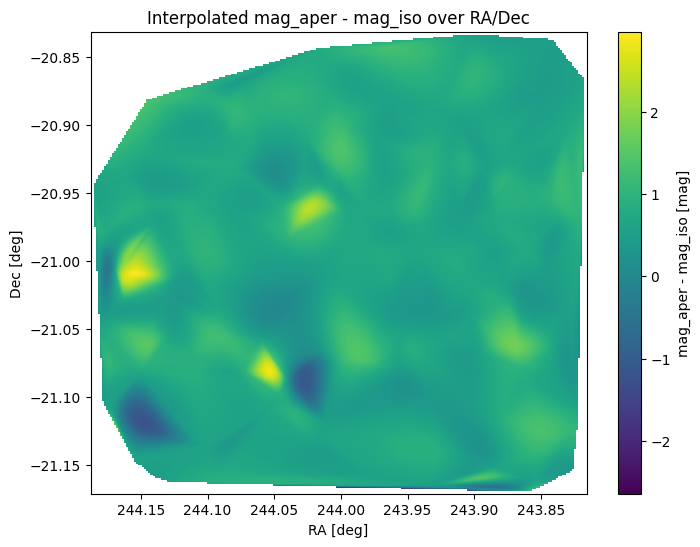

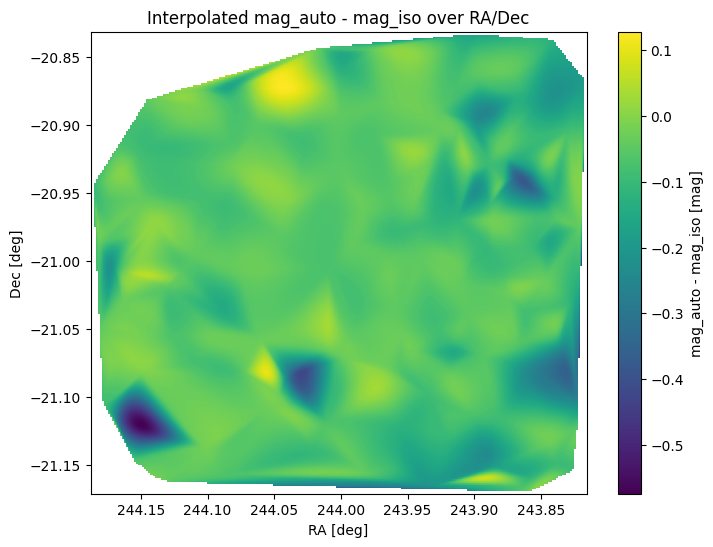

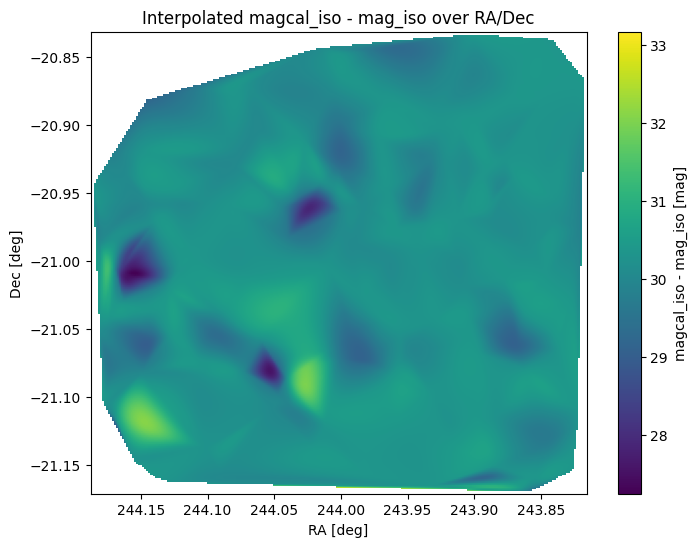

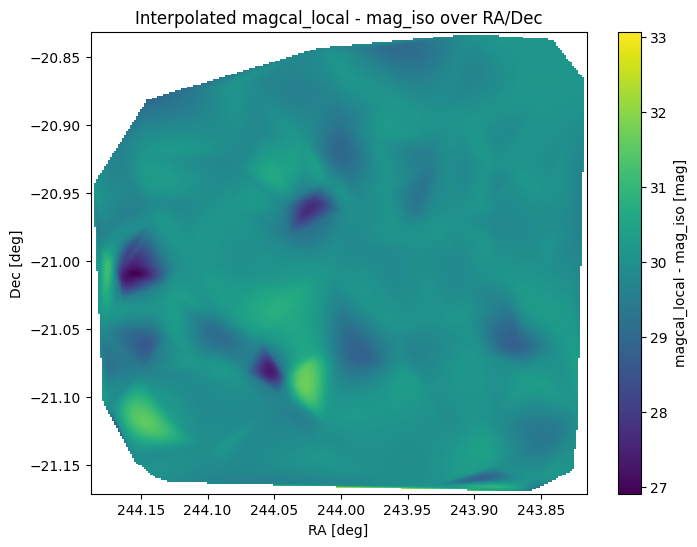

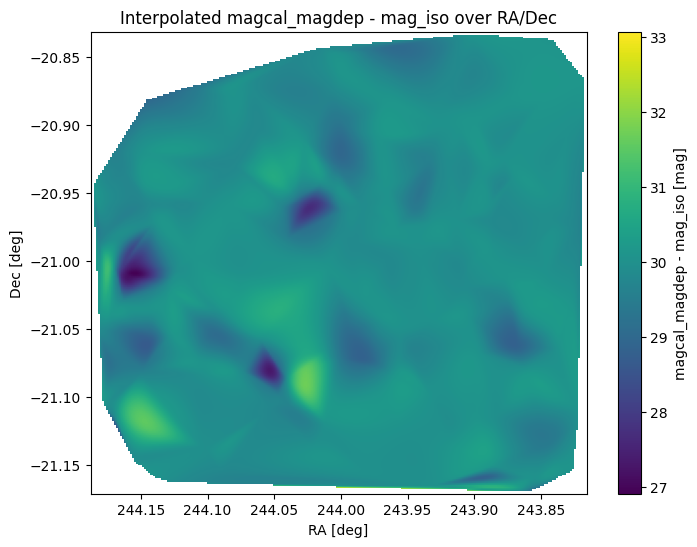

...

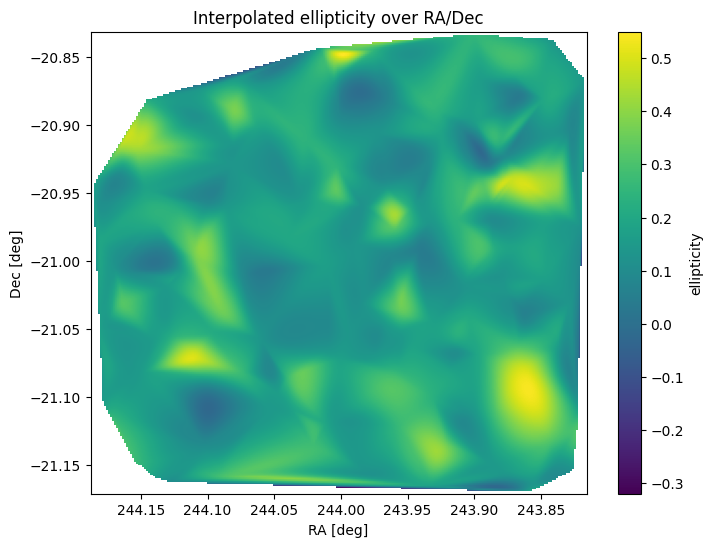

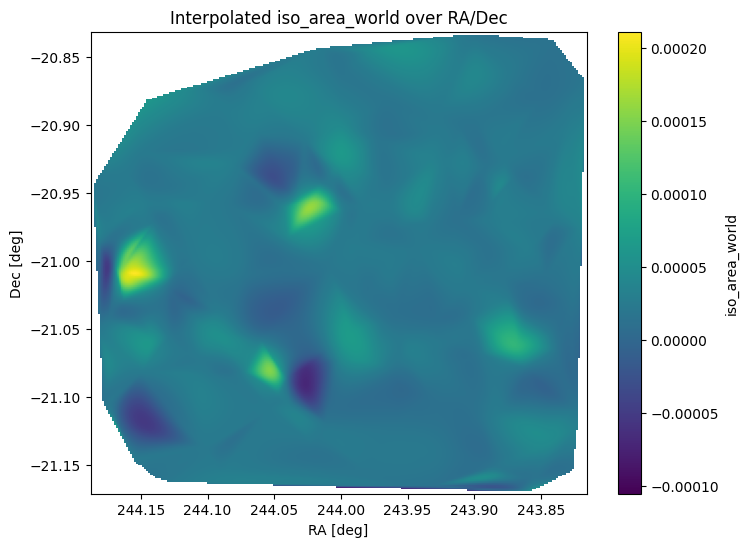

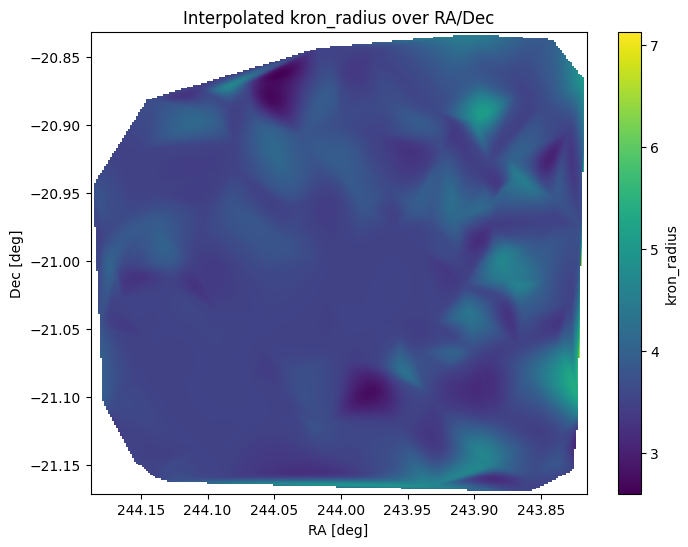

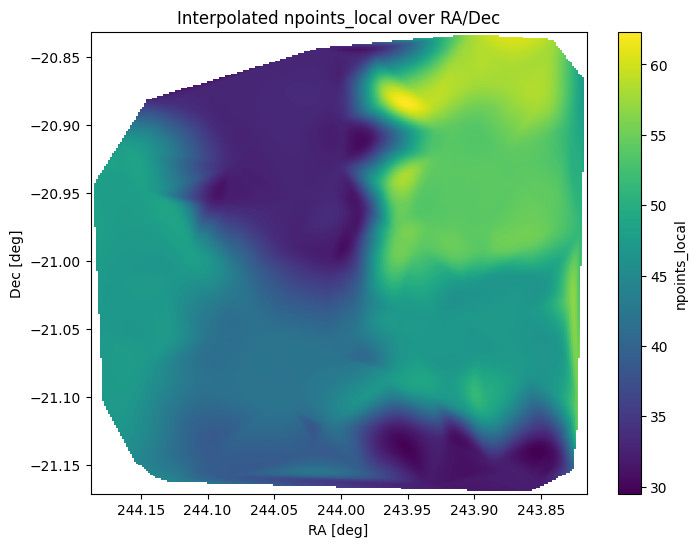

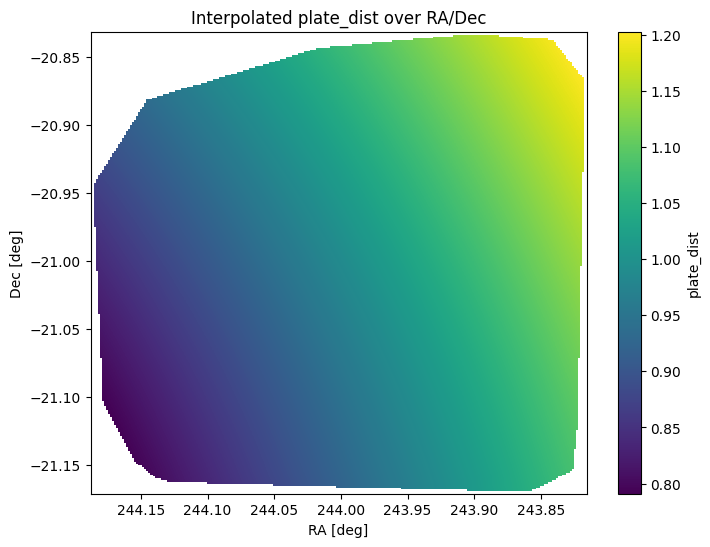

In [8]:
plot_all_radec_grid_maps_magdiffs(
    phot,
    method="cubic",
    grid_n=250,
    show_points=False,
)

In [9]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import ZScaleInterval, ImageNormalize, AsinhStretch

Downsampled cutout by factor 2; new shape = (1235, 1253)


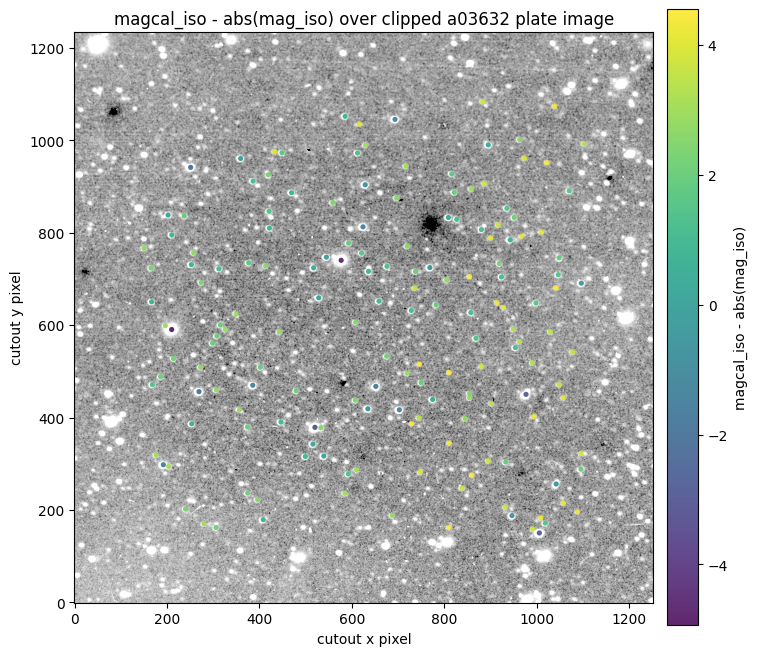

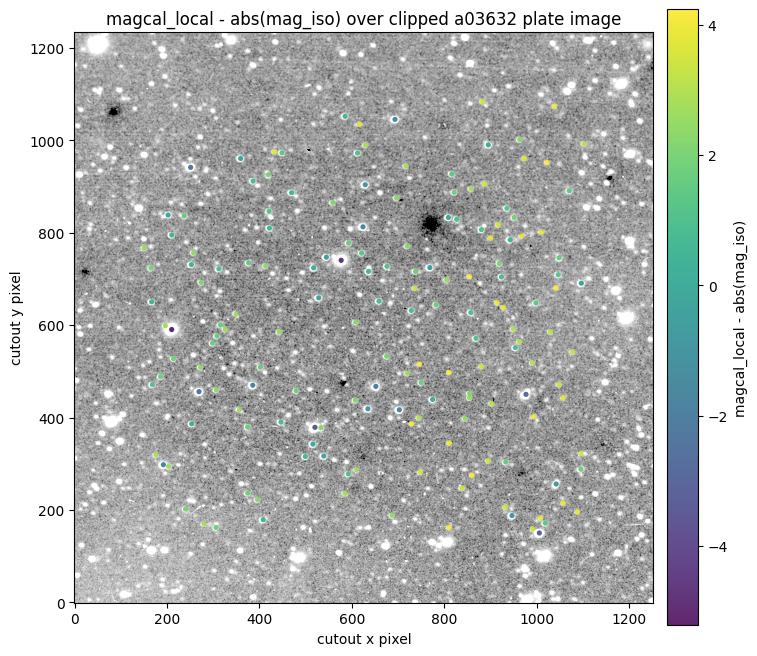

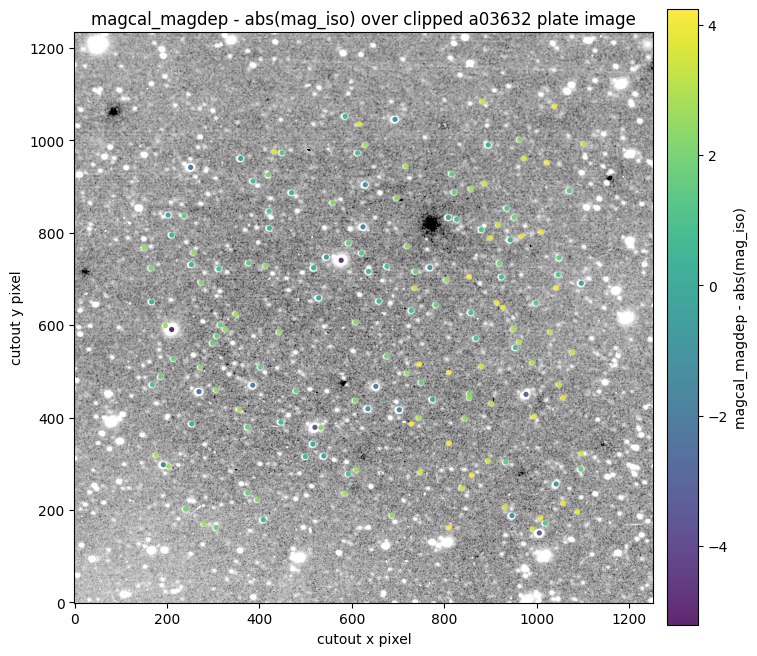

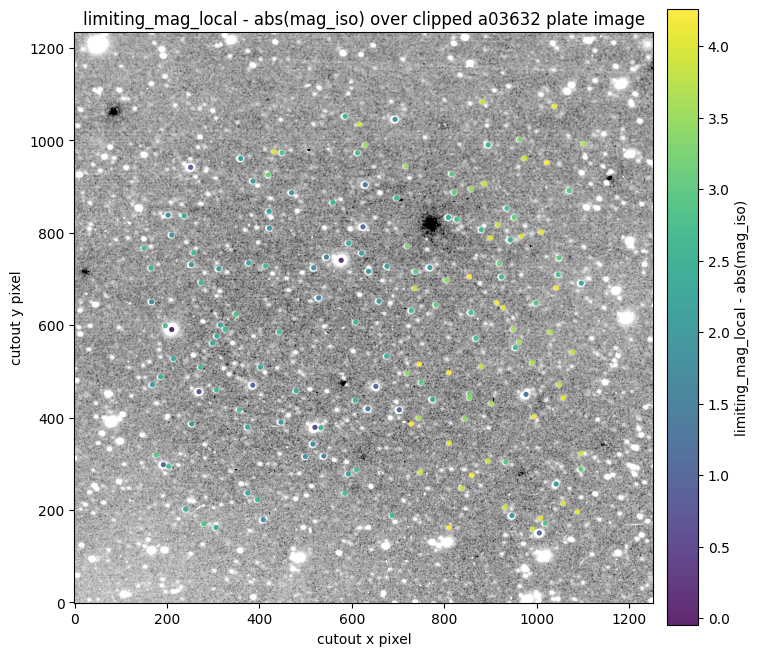

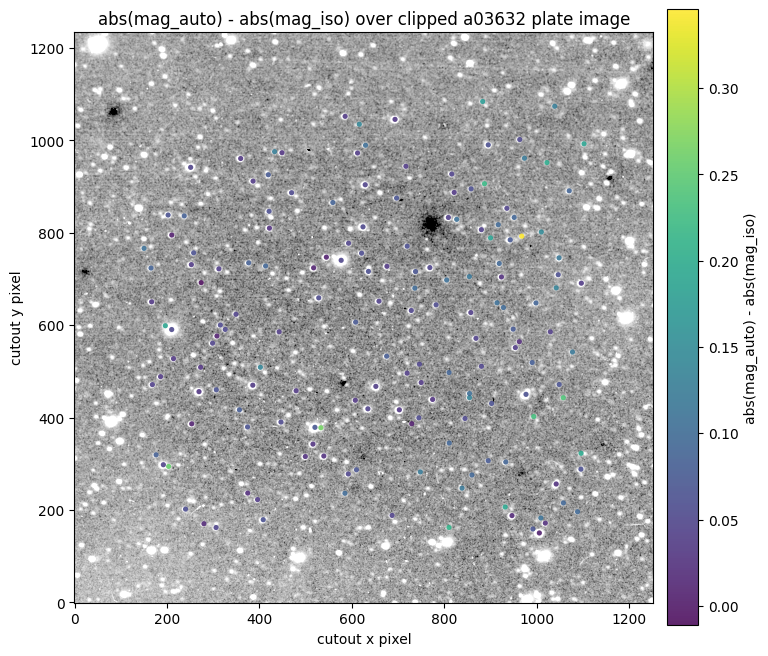

...

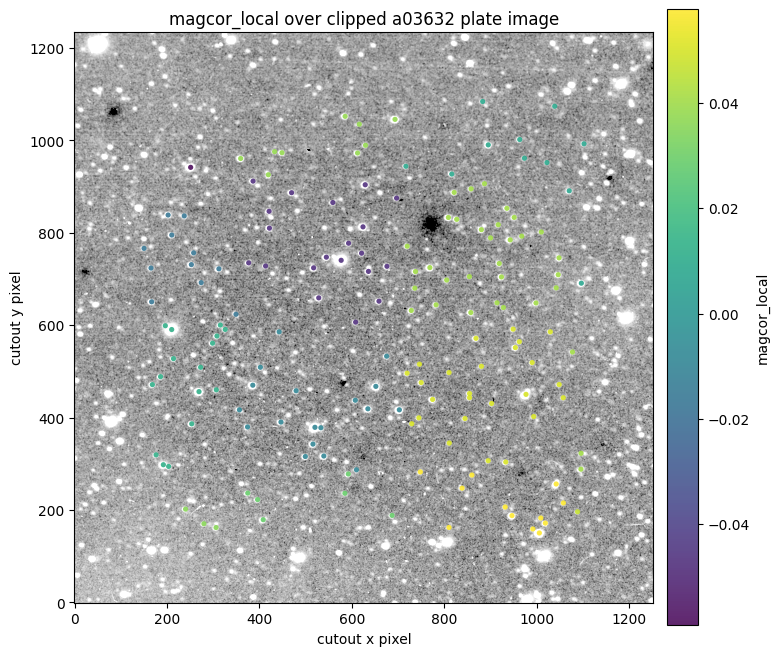

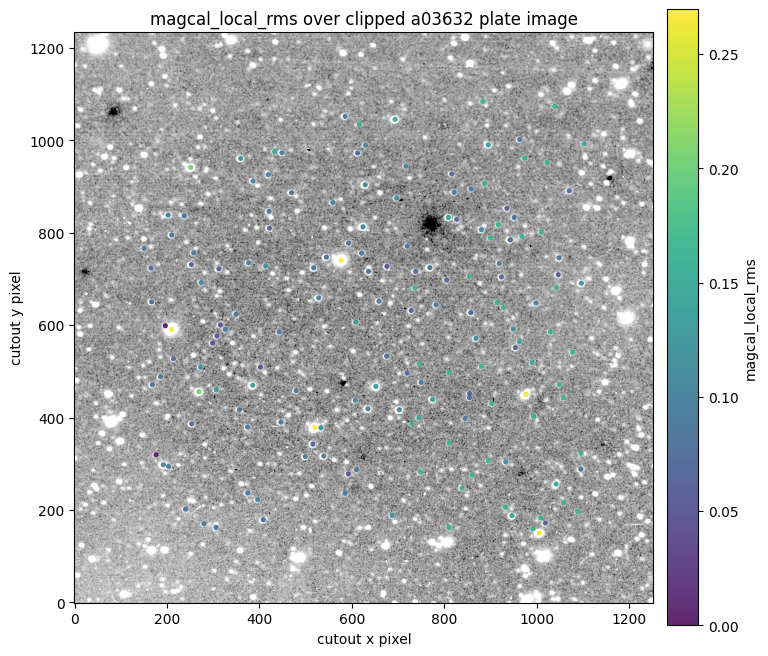

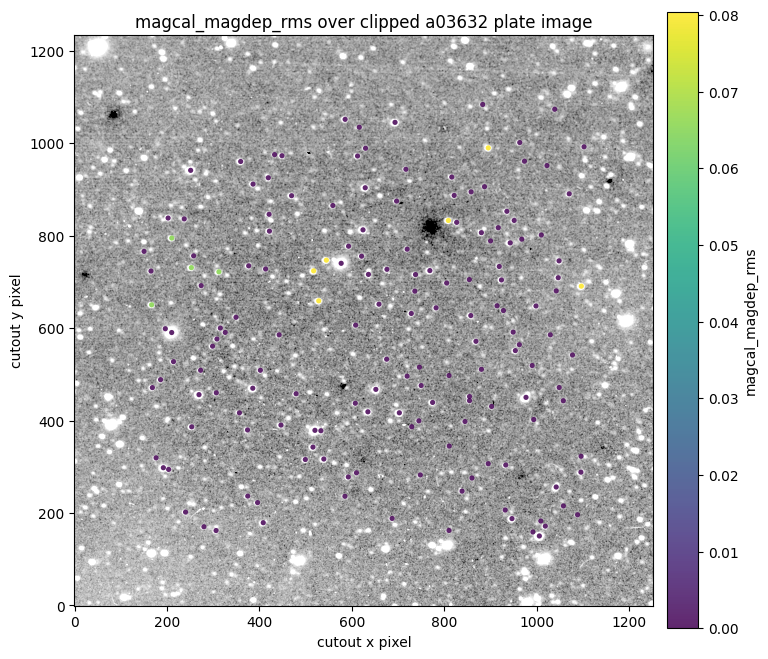

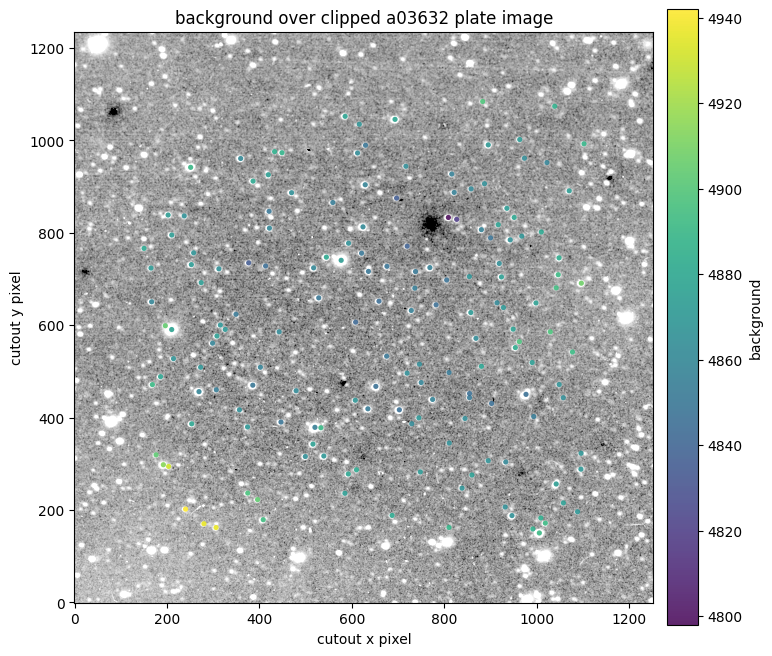

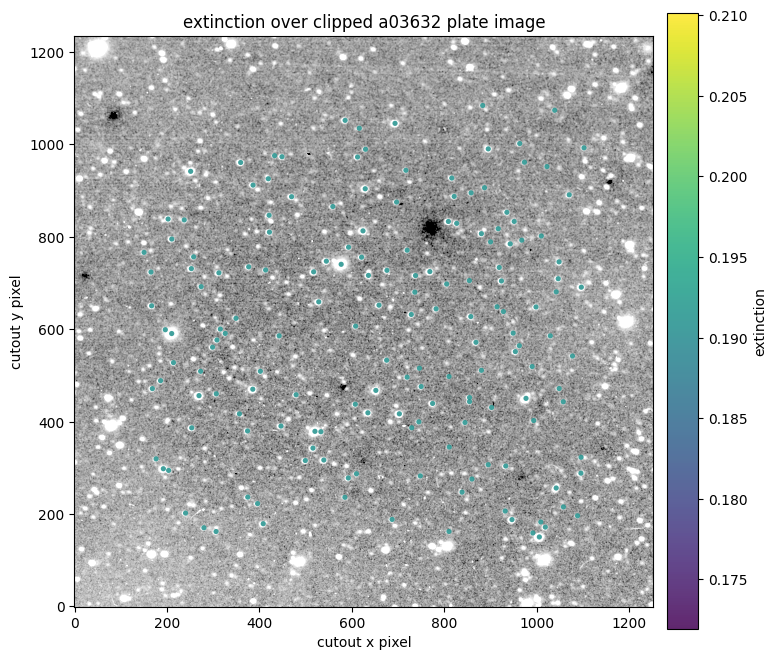

In [10]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from astropy.visualization import ZScaleInterval, ImageNormalize, AsinhStretch


def plot_key_calibration_overlays_on_plate_clipped_pixels(phot, fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz", ref_col="mag_iso", pad_pix=300, max_pix=1800, downsample=1):
    """
    Plot key DASCH calibration overlays on a clipped FITS image, using DASCH image_x/image_y directly instead of WCS RA/Dec.

    Magnitude deltas use abs(ref_col) because raw SExtractor mags like mag_iso can be negative, while calibrated mags are positive.
    Raw magnitude columns are compared as abs(raw_mag) - abs(ref_col).
    """

    if "image_x" not in phot.colnames or "image_y" not in phot.colnames:
        raise ValueError("phot must contain image_x and image_y columns")

    if ref_col not in phot.colnames:
        raise ValueError(f"{ref_col!r} not found")

    x = np.asarray(phot["image_x"], dtype=float)
    y = np.asarray(phot["image_y"], dtype=float)
    good_xy = np.isfinite(x) & np.isfinite(y)

    x0 = int(np.floor(np.nanmin(x[good_xy]) - pad_pix))
    x1 = int(np.ceil(np.nanmax(x[good_xy]) + pad_pix))
    y0 = int(np.floor(np.nanmin(y[good_xy]) - pad_pix))
    y1 = int(np.ceil(np.nanmax(y[good_xy]) + pad_pix))

    with fits.open(fits_path, memmap=True) as hdul:
        hdu = next(h for h in hdul if h.data is not None and np.squeeze(h.data).ndim == 2)
        image_shape = np.squeeze(hdu.data).shape
        ny, nx = image_shape

        x0 = max(0, x0)
        x1 = min(nx, x1)
        y0 = max(0, y0)
        y1 = min(ny, y1)

        cut_data = np.asarray(hdu.data[y0:y1, x0:x1], dtype=float)

    ny_cut, nx_cut = cut_data.shape
    auto_factor = max(1, int(np.ceil(max(nx_cut, ny_cut) / max_pix)))
    factor = max(downsample, auto_factor)

    if factor > 1:
        cut_data = cut_data[::factor, ::factor]
        print(f"Downsampled cutout by factor {factor}; new shape = {cut_data.shape}")
    else:
        print(f"Cutout shape = {cut_data.shape}")

    x_cut = (x - x0) / factor
    y_cut = (y - y0) / factor

    finite = cut_data[np.isfinite(cut_data)]
    interval = ZScaleInterval()
    vmin, vmax = interval.get_limits(finite)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

    ref = np.abs(np.asarray(phot[ref_col], dtype=float))
    plots = {}

    for col in ["magcal_iso", "magcal_local", "magcal_magdep", "limiting_mag_local"]:
        if col in phot.colnames:
            plots[f"{col} - abs({ref_col})"] = np.asarray(phot[col], dtype=float) - ref

    for col in ["mag_auto", "mag_aper"]:
        if col in phot.colnames:
            plots[f"abs({col}) - abs({ref_col})"] = np.abs(np.asarray(phot[col], dtype=float)) - ref

    for col in ["magcor_local", "magcal_local_rms", "magcal_magdep_rms", "background", "extinction"]:
        if col in phot.colnames:
            plots[col] = np.asarray(phot[col], dtype=float)

    for name, z in plots.items():
        good = good_xy & np.isfinite(x_cut) & np.isfinite(y_cut) & np.isfinite(z) & (x_cut >= 0) & (x_cut < cut_data.shape[1]) & (y_cut >= 0) & (y_cut < cut_data.shape[0])

        fig, ax = plt.subplots(figsize=(9, 8))
        ax.imshow(cut_data, origin="lower", cmap="gray", norm=norm)

        sc = ax.scatter(x_cut[good], y_cut[good], c=z[good], s=14, alpha=0.85, edgecolors="none")
        plt.colorbar(sc, ax=ax, pad=0.02, label=name)

        ax.set_xlabel("cutout x pixel")
        ax.set_ylabel("cutout y pixel")
        ax.set_title(f"{name} over clipped a03632 plate image")
        plt.show()


plot_key_calibration_overlays_on_plate_clipped_pixels(phot, fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz", pad_pix=300, max_pix=1800)

mag_auto vs mag_iso: y = 0.961859 x + -0.611927, N=166, r=0.9979, RMS=0.0475, median resid=0.009146, MAD=0.02287


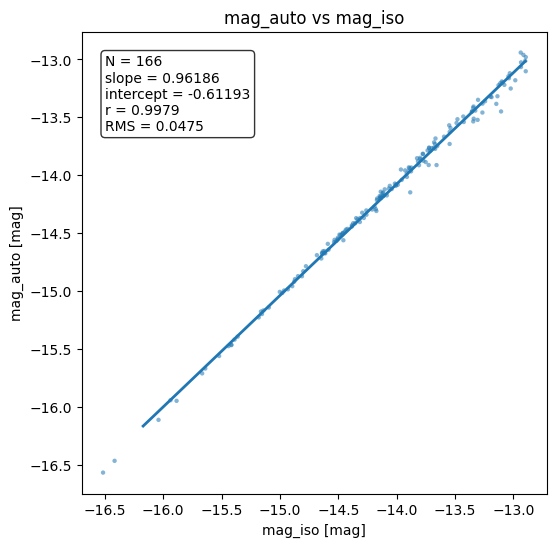

mag_aper vs mag_iso: y = 0.663645 x + -3.99785, N=166, r=0.9524, RMS=0.1597, median resid=-0.04989, MAD=0.07687


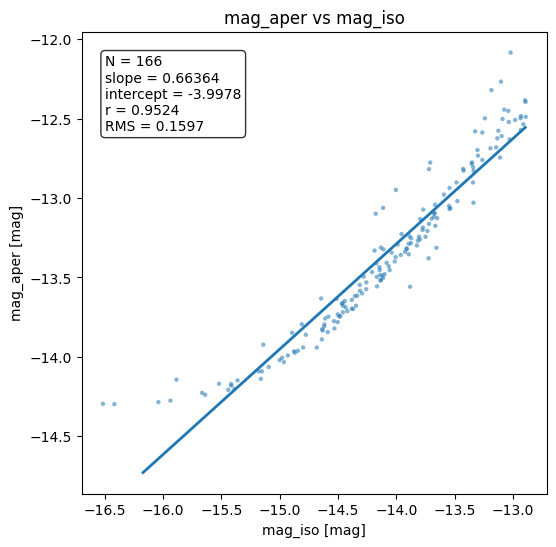

magcal_iso vs mag_iso: y = 1.42981 x + 36.2075, N=166, r=0.9852, RMS=0.1868, median resid=0.06886, MAD=0.06822


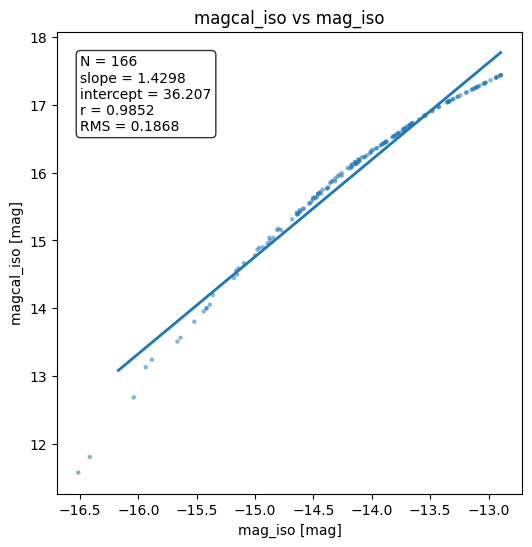

magcal_local vs mag_iso: y = 1.42149 x + 35.8097, N=166, r=0.9846, RMS=0.1899, median resid=0.05925, MAD=0.09083


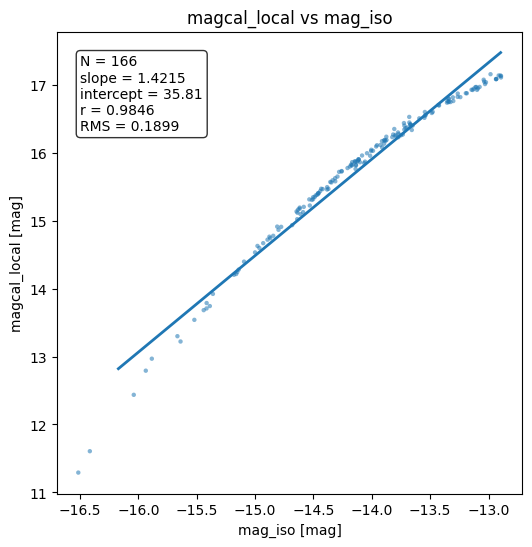

magcal_magdep vs mag_iso: y = 1.41999 x + 35.7896, N=166, r=0.9845, RMS=0.1905, median resid=0.06342, MAD=0.08878


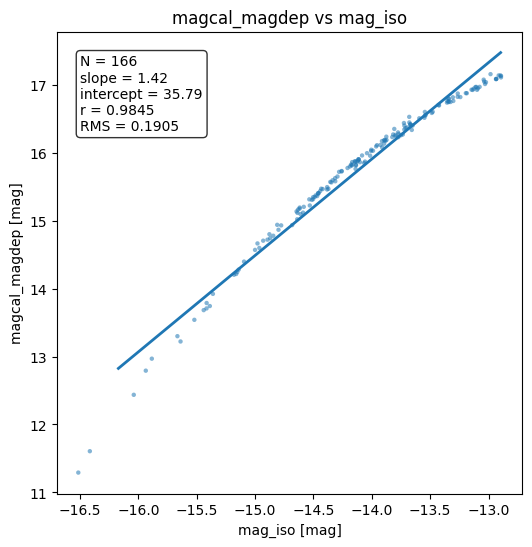

limiting_mag_local vs mag_iso: y = 0.168685 x + 19.2276, N=166, r=0.3717, RMS=0.3169, median resid=0.1057, MAD=0.2694


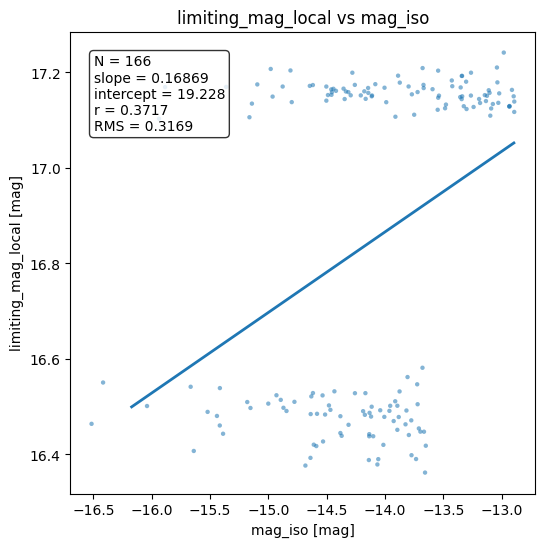

blended_mag vs mag_iso: y = 0.727489 x + 11.6032, N=166, r=0.1234, RMS=4.4, median resid=-1.315, MAD=0.3617


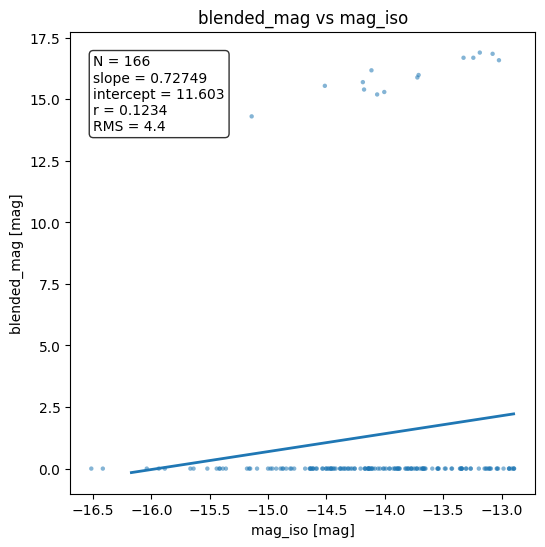

mag_aper vs mag_auto: y = 0.681737 x + -3.69222, N=166, r=0.9431, RMS=0.1743, median resid=-0.06128, MAD=0.09029


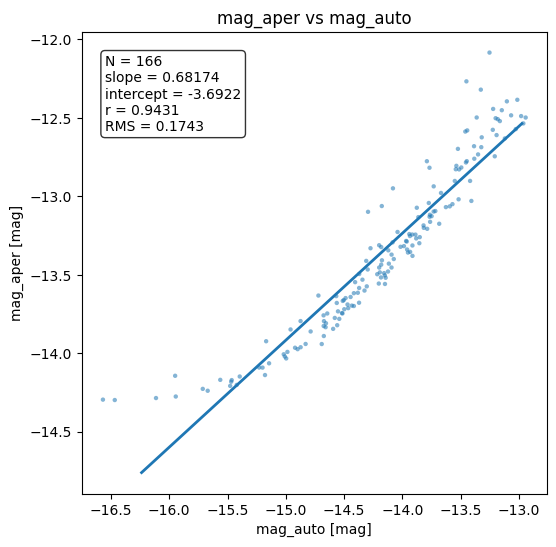

magcal_iso vs mag_auto: y = 1.48546 x + 37.1022, N=166, r=0.9867, RMS=0.1777, median resid=0.04983, MAD=0.07478


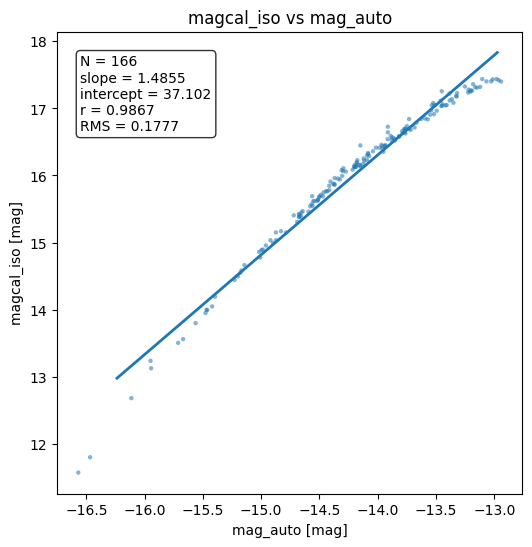

magcal_local vs mag_auto: y = 1.47641 x + 36.6936, N=166, r=0.9858, RMS=0.1827, median resid=0.03824, MAD=0.09772


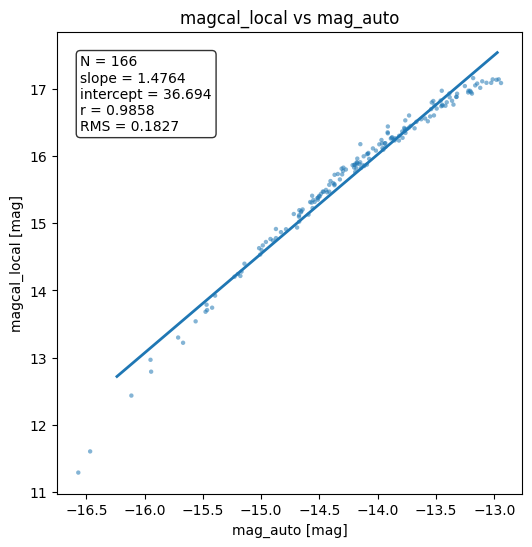

magcal_magdep vs mag_auto: y = 1.47487 x + 36.6726, N=166, r=0.9856, RMS=0.1833, median resid=0.03768, MAD=0.09865


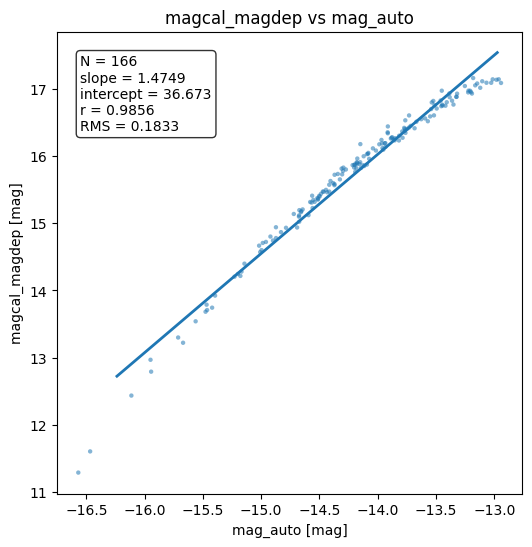

limiting_mag_local vs mag_auto: y = 0.17151 x + 19.2801, N=166, r=0.3643, RMS=0.3179, median resid=0.1062, MAD=0.2674


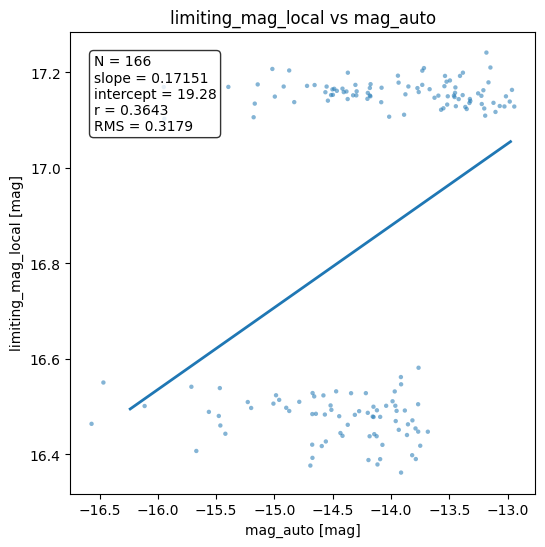

blended_mag vs mag_auto: y = 0.722337 x + 11.584, N=166, r=0.1181, RMS=4.402, median resid=-1.33, MAD=0.3464


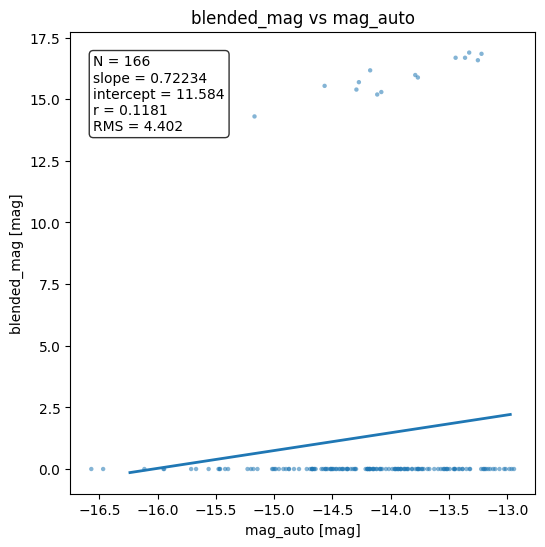

magcal_iso vs mag_aper: y = 1.87864 x + 41.1363, N=166, r=0.9020, RMS=0.4713, median resid=0.1539, MAD=0.1793


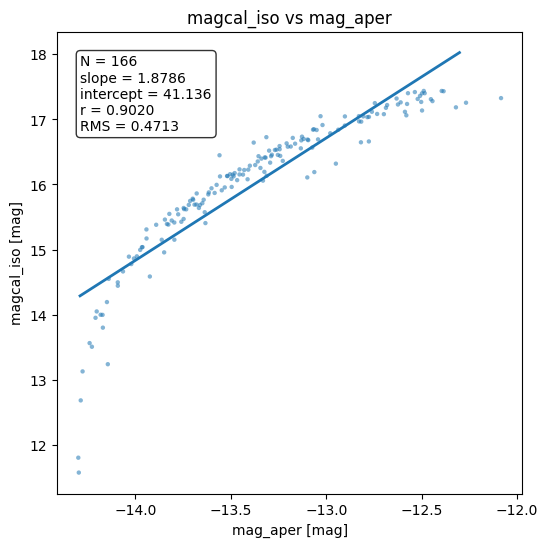

magcal_local vs mag_aper: y = 1.86863 x + 40.7222, N=166, r=0.9019, RMS=0.4692, median resid=0.152, MAD=0.1798


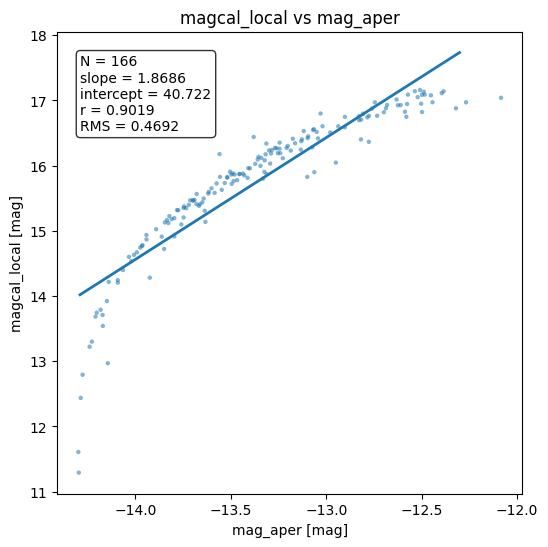

magcal_magdep vs mag_aper: y = 1.86639 x + 40.6934, N=166, r=0.9016, RMS=0.4693, median resid=0.161, MAD=0.1716


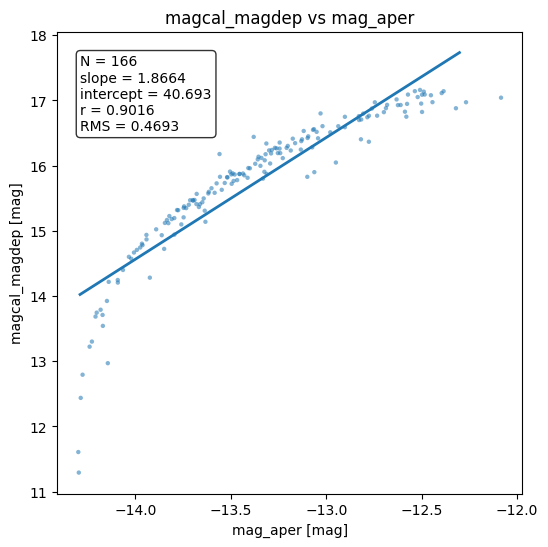

limiting_mag_local vs mag_aper: y = 0.280972 x + 20.6016, N=166, r=0.4315, RMS=0.3079, median resid=0.03665, MAD=0.2939


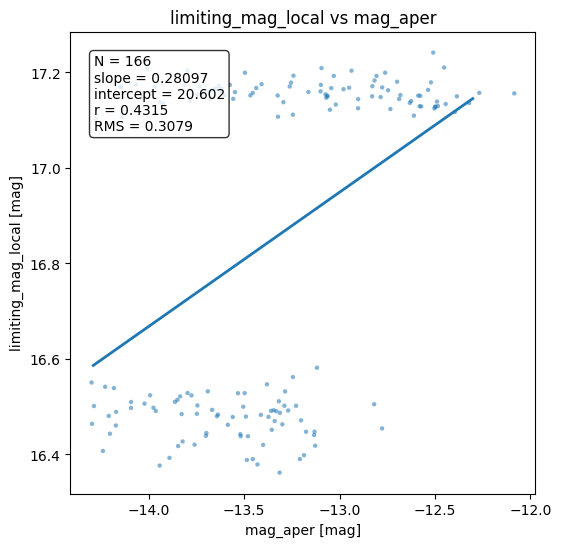

blended_mag vs mag_aper: y = 2.20928 x + 30.8526, N=166, r=0.2612, RMS=4.28, median resid=-1.042, MAD=0.8506


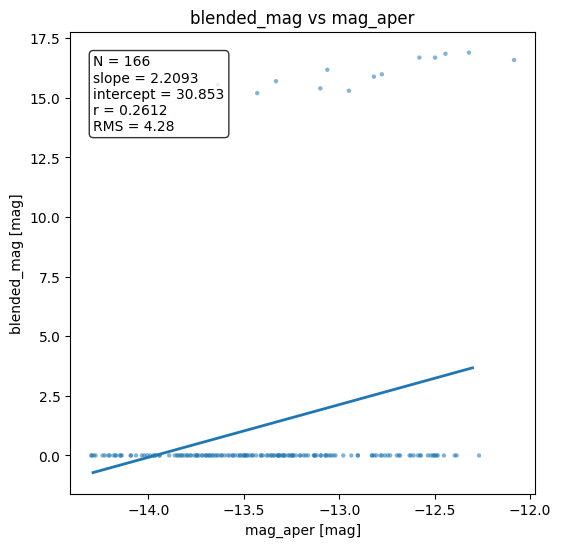

magcal_local vs magcal_iso: y = 0.99425 x + -0.188099, N=166, r=0.9994, RMS=0.03713, median resid=0.0004069, MAD=0.02186


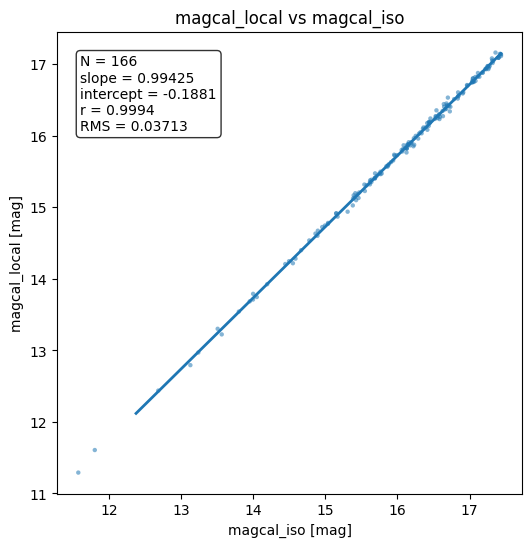

magcal_magdep vs magcal_iso: y = 0.993281 x + -0.171591, N=166, r=0.9994, RMS=0.03863, median resid=-0.0006306, MAD=0.02277


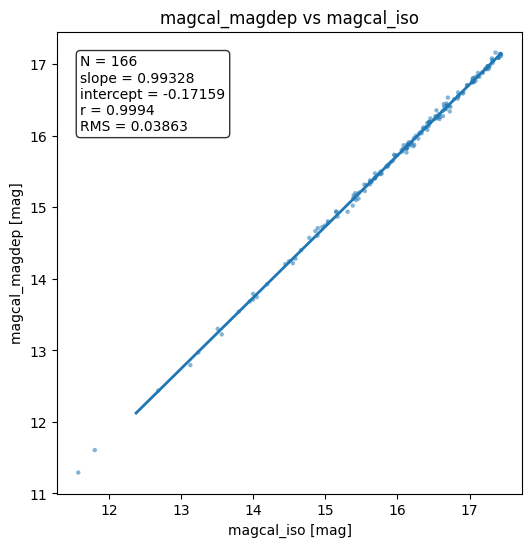

limiting_mag_local vs magcal_iso: y = 0.107195 x + 15.1289, N=166, r=0.3428, RMS=0.3206, median resid=0.1524, MAD=0.2332


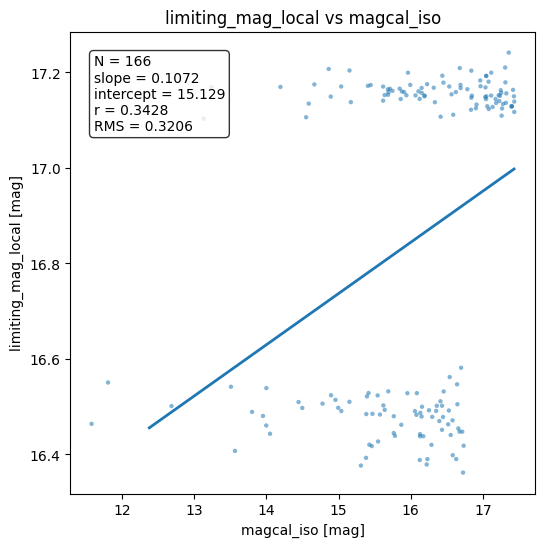

blended_mag vs magcal_iso: y = 0.496905 x + -6.62831, N=166, r=0.1223, RMS=4.4, median resid=-1.387, MAD=0.3533


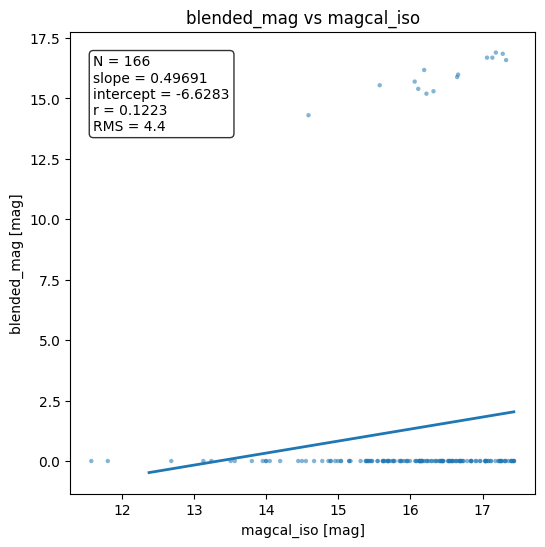

magcal_magdep vs magcal_local: y = 0.999058 x + 0.0158044, N=166, r=1.0000, RMS=0.006208, median resid=-0.0006968, MAD=0.0006122


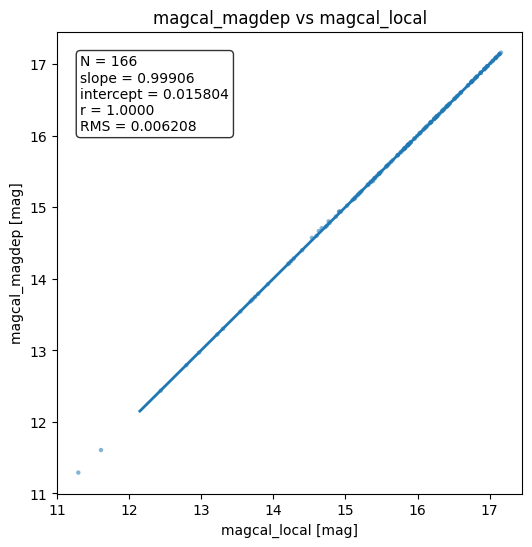

limiting_mag_local vs magcal_local: y = 0.108182 x + 15.1434, N=166, r=0.3442, RMS=0.3205, median resid=0.1521, MAD=0.2347


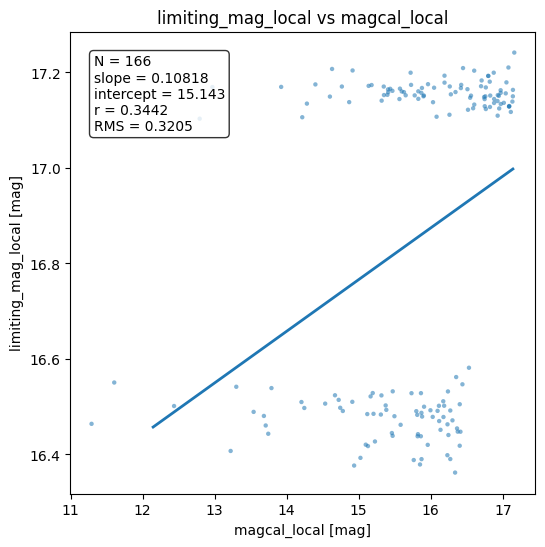

blended_mag vs magcal_local: y = 0.486471 x + -6.32453, N=166, r=0.1192, RMS=4.402, median resid=-1.383, MAD=0.3428


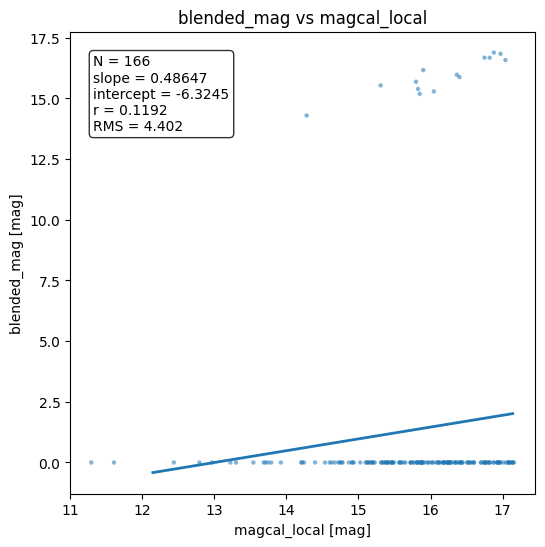

limiting_mag_local vs magcal_magdep: y = 0.108457 x + 15.139, N=166, r=0.3448, RMS=0.3204, median resid=0.1524, MAD=0.2348


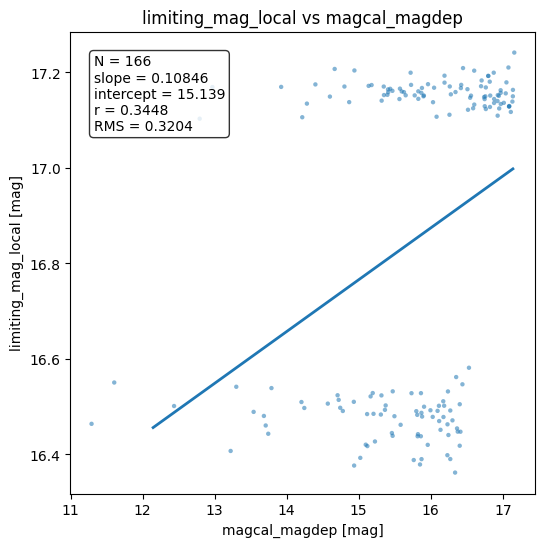

blended_mag vs magcal_magdep: y = 0.486282 x + -6.32201, N=166, r=0.1190, RMS=4.402, median resid=-1.383, MAD=0.3426


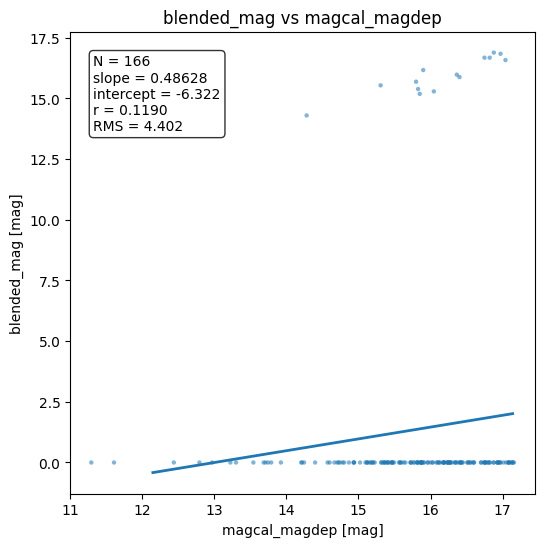

blended_mag vs limiting_mag_local: y = 0.646467 x + -9.54819, N=166, r=0.0498, RMS=4.428, median resid=-1.165, MAD=0.3615


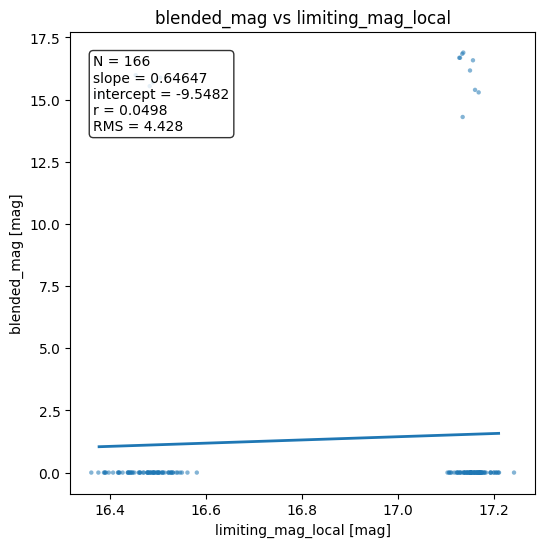

In [11]:
import numpy as np
import matplotlib.pyplot as plt


def plot_dasch_magnitude_scatter_pairs_fit(phot, max_points=None):
    mag_cols = [
        "mag_iso",
        "mag_auto",
        "mag_aper",
        "magcal_iso",
        "magcal_local",
        "magcal_magdep",
        "limiting_mag_local",
        "blended_mag",
    ]
    mag_cols = [c for c in mag_cols if c in phot.colnames]

    data = {c: np.asarray(phot[c], dtype=float) for c in mag_cols}

    fit_results = []

    for i, xcol in enumerate(mag_cols):
        for ycol in mag_cols[i + 1:]:
            x = data[xcol]
            y = data[ycol]

            good = np.isfinite(x) & np.isfinite(y)

            if max_points is not None and good.sum() > max_points:
                idx = np.where(good)[0]
                idx = np.random.choice(idx, size=max_points, replace=False)
                good = np.zeros(len(x), dtype=bool)
                good[idx] = True

            n = good.sum()

            if n < 2:
                print(f"Skipping {ycol} vs {xcol}: fewer than 2 finite values")
                continue

            xg = x[good]
            yg = y[good]

            # Linear fit: y = m*x + b
            m, b = np.polyfit(xg, yg, deg=1)

            yfit = m * xg + b
            resid = yg - yfit

            rms = np.sqrt(np.mean(resid**2))
            median_resid = np.median(resid)
            mad_resid = np.median(np.abs(resid - median_resid))

            r = np.corrcoef(xg, yg)[0, 1]

            fit_results.append({
                "xcol": xcol,
                "ycol": ycol,
                "n": n,
                "slope": m,
                "intercept": b,
                "r": r,
                "rms": rms,
                "median_resid": median_resid,
                "mad_resid": mad_resid,
            })

            print(
                f"{ycol} vs {xcol}: "
                f"y = {m:.6g} x + {b:.6g}, "
                f"N={n}, r={r:.4f}, RMS={rms:.4g}, "
                f"median resid={median_resid:.4g}, MAD={mad_resid:.4g}"
            )

            fig, ax = plt.subplots(figsize=(6, 6))
            ax.scatter(xg, yg, s=10, alpha=0.55, edgecolors="none")

            xmin, xmax = np.nanpercentile(xg, [1, 99])
            xx = np.linspace(xmin, xmax, 200)
            yy = m * xx + b

            ax.plot(
                xx,
                yy,
                linewidth=2,
                label=f"fit: y = {m:.3f}x + {b:.3f}"
            )

            ax.set_xlabel(f"{xcol} [mag]")
            ax.set_ylabel(f"{ycol} [mag]")
            ax.set_title(f"{ycol} vs {xcol}")

            text = (
                f"N = {n}\n"
                f"slope = {m:.5g}\n"
                f"intercept = {b:.5g}\n"
                f"r = {r:.4f}\n"
                f"RMS = {rms:.4g}"
            )

            ax.text(
                0.05,
                0.95,
                text,
                transform=ax.transAxes,
                va="top",
                ha="left",
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
            )

            #ax.legend()
            plt.show()

    return fit_results


fit_results = plot_dasch_magnitude_scatter_pairs_fit(phot)

In [12]:
import numpy as np
from scipy.interpolate import griddata
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import HuberRegressor
from sklearn.pipeline import make_pipeline


def build_simple_dasch_mimic(phot, degree=2):
    mag_iso = np.asarray(phot["mag_iso"], dtype=float)
    magcal_iso = np.asarray(phot["magcal_iso"], dtype=float)
    magcal_local = np.asarray(phot["magcal_local"], dtype=float)
    magcal_magdep = np.asarray(phot["magcal_magdep"], dtype=float)
    x = np.asarray(phot["image_x"], dtype=float)
    y = np.asarray(phot["image_y"], dtype=float)

    good_iso = np.isfinite(mag_iso) & np.isfinite(magcal_iso)
    good_local = np.isfinite(x) & np.isfinite(y) & np.isfinite(magcal_iso) & np.isfinite(magcal_local)
    good_magdep = np.isfinite(magcal_local) & np.isfinite(magcal_magdep)

    # 1. Raw instrumental mag_iso -> calibrated magcal_iso.
    # Use robust quadratic by default.
    iso_model = make_pipeline(PolynomialFeatures(degree), HuberRegressor())
    iso_model.fit(mag_iso[good_iso].reshape(-1, 1), magcal_iso[good_iso])

    # 2. Local correction is spatial: magcal_local - magcal_iso.
    xy_local = np.column_stack([x[good_local], y[good_local]])
    d_local = magcal_local[good_local] - magcal_iso[good_local]

    # 3. Mag-dependent correction is often tiny here.
    d_magdep = magcal_magdep[good_magdep] - magcal_local[good_magdep]
    d_magdep_median = np.nanmedian(d_magdep)

    def local_correction(x0, y0):
        z = griddata(xy_local, d_local, [(x0, y0)], method="linear")[0]
        if not np.isfinite(z):
            z = griddata(xy_local, d_local, [(x0, y0)], method="nearest")[0]
        return z

    def calibrate(mag_iso_new, image_x_new, image_y_new, use_magdep=True):
        magcal_iso_like = iso_model.predict(np.array([[mag_iso_new]], dtype=float))[0]
        dloc = local_correction(image_x_new, image_y_new)
        magcal_local_like = magcal_iso_like + dloc

        if use_magdep:
            magcal_magdep_like = magcal_local_like + d_magdep_median
        else:
            magcal_magdep_like = magcal_local_like

        return {
            "mag_iso": mag_iso_new,
            "magcal_iso_like": magcal_iso_like,
            "local_correction": dloc,
            "magcal_local_like": magcal_local_like,
            "magdep_correction_median": d_magdep_median if use_magdep else 0.0,
            "magcal_magdep_like": magcal_magdep_like,
        }

    return calibrate, iso_model

In [13]:
calibrate_like_dasch, iso_model = build_simple_dasch_mimic(phot, degree=2)

result = calibrate_like_dasch(
    mag_iso_new=-14.5,
    image_x_new=12000,
    image_y_new=8000,
)

result

{'mag_iso': -14.5,
 'magcal_iso_like': 15.607122118073224,
 'local_correction': -0.3302593231201172,
 'magcal_local_like': 15.276862794953107,
 'magdep_correction_median': 0.0,
 'magcal_magdep_like': 15.276862794953107}

Stage 1: mag_iso -> magcal_iso polynomial CV, 70/30 train/test
degree 1: MAE=0.0640, MAD=0.0633, RMS=0.1257, median=-0.0244
degree 2: MAE=0.0065, MAD=0.0108, RMS=0.0199, median=-0.0009  <-- chosen
degree 3: MAE=0.0084, MAD=0.0124, RMS=0.0184, median=0.0001
degree 4: MAE=0.0069, MAD=0.0082, RMS=0.0224, median=0.0014
degree 5: MAE=0.4431, MAD=0.4277, RMS=0.5554, median=0.2403

Stage 2: magcal_iso -> magcal_local spatial correction, test residuals
linear spatial: MAE=0.0196, MAD=0.0292, RMS=0.0340, median=-0.0002
quadratic spatial: MAE=0.0213, MAD=0.0324, RMS=0.0350, median=-0.0029
cubic spatial: MAE=0.0242, MAD=0.0321, RMS=0.0359, median=0.0026

Stage 3: mimic magcal_magdep, test residuals
linear spatial: MAE=0.0252, MAD=0.0359, RMS=0.0362, median=0.0010, dmagdep_median=0.0006
quadratic spatial: MAE=0.0223, MAD=0.0351, RMS=0.0375, median=-0.0028, dmagdep_median=0.0001
cubic spatial: MAE=0.0247, MAD=0.0390, RMS=0.0380, median=-0.0015, dmagdep_median=-0.0041


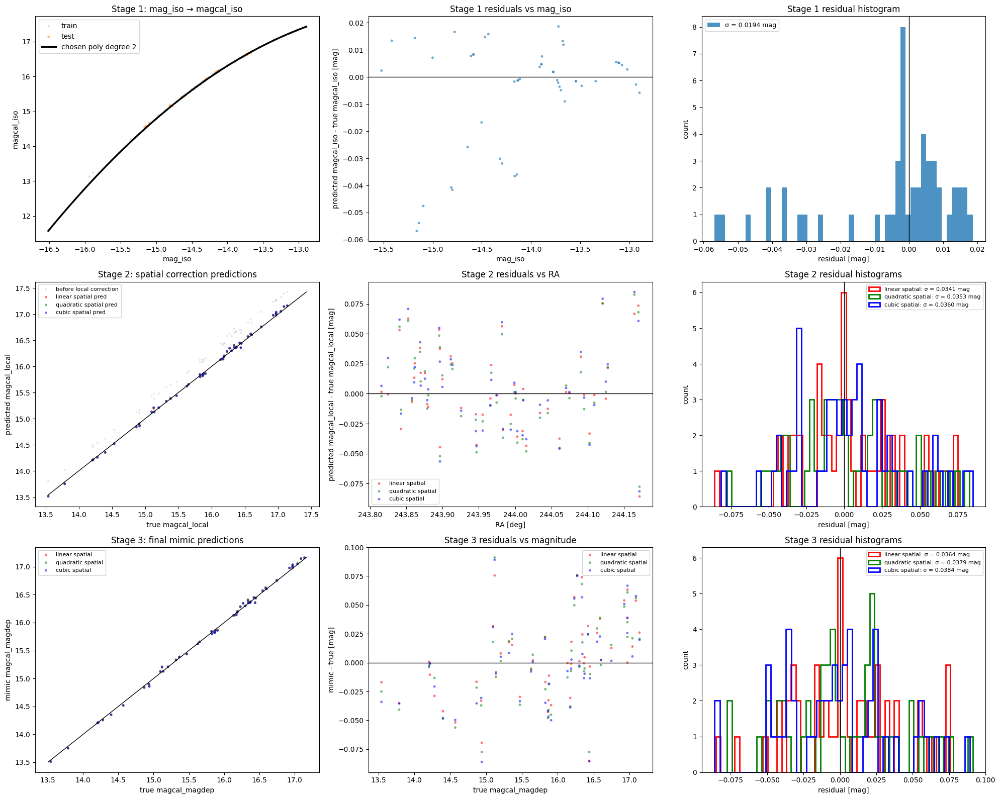

In [21]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error


def _arr(phot, col):
    return np.asarray(phot[col], dtype=float)


def _sky_xy(phot):
    if "pos" in phot.colnames:
        return np.asarray(phot["pos"].ra.deg, dtype=float), np.asarray(phot["pos"].dec.deg, dtype=float)
    return _arr(phot, "catalog_ra"), _arr(phot, "catalog_dec")


def _metrics(y, yhat):
    r = yhat - y
    r = r[np.isfinite(r)]
    med = np.nanmedian(r)
    mad = 1.4826 * np.nanmedian(np.abs(r - med))
    rms = np.sqrt(np.nanmean(r**2))
    mae = np.nanmedian(np.abs(r))
    return med, mad, rms, mae


def validate_dasch_polynomial_mimic(phot, iso_degrees=(1, 2, 3, 4, 5), local_degrees=(1, 2, 3), test_size=0.30, random_state=42, use_huber=True):
    mag_iso = _arr(phot, "mag_iso")
    magcal_iso = _arr(phot, "magcal_iso")
    magcal_local = _arr(phot, "magcal_local")
    magcal_magdep = _arr(phot, "magcal_magdep")
    ra, dec = _sky_xy(phot)
    image_x = _arr(phot, "image_x")
    image_y = _arr(phot, "image_y")

    good = np.isfinite(mag_iso) & np.isfinite(magcal_iso) & np.isfinite(magcal_local) & np.isfinite(magcal_magdep) & np.isfinite(ra) & np.isfinite(dec) & np.isfinite(image_x) & np.isfinite(image_y)
    idx = np.where(good)[0]
    train_idx, test_idx = train_test_split(idx, test_size=test_size, random_state=random_state)

    reg_factory = lambda: HuberRegressor(max_iter=2000) if use_huber else LinearRegression()

    # Stage 1: mag_iso -> magcal_iso, polynomial model selection
    iso_results = []
    iso_models = {}
    for deg in iso_degrees:
        model = make_pipeline(PolynomialFeatures(deg, include_bias=True), reg_factory())
        model.fit(mag_iso[train_idx].reshape(-1, 1), magcal_iso[train_idx])
        pred = model.predict(mag_iso[test_idx].reshape(-1, 1))
        med, mad, rms, mae = _metrics(magcal_iso[test_idx], pred)
        iso_results.append({"degree": deg, "median": med, "mad": mad, "rms": rms, "mae": mae})
        iso_models[deg] = model

    chosen_iso = min(iso_results, key=lambda d: d["mae"])["degree"]
    iso_model = iso_models[chosen_iso]
    magcal_iso_pred_test = iso_model.predict(mag_iso[test_idx].reshape(-1, 1))
    iso_resid_test = magcal_iso_pred_test - magcal_iso[test_idx]

    # Stage 2: magcal_iso -> magcal_local via spatial polynomial correction
    # Fit d_local = magcal_local - magcal_iso_pred as f(image_x, image_y).
    local_models = {}
    local_results = {}
    local_colors = {1: "r", 2: "g", 3: "b"}
    local_labels = {1: "linear spatial", 2: "quadratic spatial", 3: "cubic spatial"}

    magcal_iso_pred_train = iso_model.predict(mag_iso[train_idx].reshape(-1, 1))
    dlocal_train = magcal_local[train_idx] - magcal_iso_pred_train
    xy_train = np.column_stack([image_x[train_idx], image_y[train_idx]])
    xy_test = np.column_stack([image_x[test_idx], image_y[test_idx]])

    for deg in local_degrees:
        model = make_pipeline(PolynomialFeatures(deg, include_bias=True), LinearRegression())
        model.fit(xy_train, dlocal_train)
        dlocal_pred_test = model.predict(xy_test)
        magcal_local_pred_test = magcal_iso_pred_test + dlocal_pred_test
        local_resid_test = magcal_local_pred_test - magcal_local[test_idx]
        med, mad, rms, mae = _metrics(magcal_local[test_idx], magcal_local_pred_test)
        local_models[deg] = model
        local_results[deg] = {"dlocal_pred_test": dlocal_pred_test, "magcal_local_pred_test": magcal_local_pred_test, "local_resid_test": local_resid_test, "median": med, "mad": mad, "rms": rms, "mae": mae}

    # Stage 3: mimic magcal_magdep.
    # Here magdep is tiny, so use the training-set median correction for each spatial model.
    magdep_results = {}
    for deg in local_degrees:
        magcal_iso_pred_train_for_deg = magcal_iso_pred_train
        dlocal_pred_train = local_models[deg].predict(xy_train)
        magcal_local_pred_train = magcal_iso_pred_train_for_deg + dlocal_pred_train
        dmagdep_train = magcal_magdep[train_idx] - magcal_local_pred_train
        dmagdep_median = np.nanmedian(dmagdep_train)

        magcal_magdep_pred_test = local_results[deg]["magcal_local_pred_test"] + dmagdep_median
        magdep_resid_test = magcal_magdep_pred_test - magcal_magdep[test_idx]
        med, mad, rms, mae = _metrics(magcal_magdep[test_idx], magcal_magdep_pred_test)
        magdep_results[deg] = {"magcal_magdep_pred_test": magcal_magdep_pred_test, "magdep_resid_test": magdep_resid_test, "dmagdep_median": dmagdep_median, "median": med, "mad": mad, "rms": rms, "mae": mae}

    print("Stage 1: mag_iso -> magcal_iso polynomial CV, 70/30 train/test")
    for r in iso_results:
        mark = "  <-- chosen" if r["degree"] == chosen_iso else ""
        print(f"degree {r['degree']}: MAE={r['mae']:.4f}, MAD={r['mad']:.4f}, RMS={r['rms']:.4f}, median={r['median']:.4f}{mark}")

    print("\nStage 2: magcal_iso -> magcal_local spatial correction, test residuals")
    for deg in local_degrees:
        r = local_results[deg]
        print(f"{local_labels.get(deg, f'degree {deg}')}: MAE={r['mae']:.4f}, MAD={r['mad']:.4f}, RMS={r['rms']:.4f}, median={r['median']:.4f}")

    print("\nStage 3: mimic magcal_magdep, test residuals")
    for deg in local_degrees:
        r = magdep_results[deg]
        print(f"{local_labels.get(deg, f'degree {deg}')}: MAE={r['mae']:.4f}, MAD={r['mad']:.4f}, RMS={r['rms']:.4f}, median={r['median']:.4f}, dmagdep_median={r['dmagdep_median']:.4f}")

    fig, axes = plt.subplots(3, 3, figsize=(20, 16))

    # Row 1: mag_iso -> magcal_iso chosen polynomial
    ax = axes[0, 0]
    ax.scatter(mag_iso[train_idx], magcal_iso[train_idx], s=8, alpha=0.25, label="train", edgecolors="none")
    ax.scatter(mag_iso[test_idx], magcal_iso[test_idx], s=12, alpha=0.55, label="test", edgecolors="none")
    xx = np.linspace(np.nanmin(mag_iso[idx]), np.nanmax(mag_iso[idx]), 500)
    yy = iso_model.predict(xx.reshape(-1, 1))
    ax.plot(xx, yy, color="k", linewidth=2.5, label=f"chosen poly degree {chosen_iso}")
    ax.set_xlabel("mag_iso")
    ax.set_ylabel("magcal_iso")
    ax.set_title("Stage 1: mag_iso → magcal_iso")
    ax.legend()

    ax = axes[0, 1]
    ax.scatter(mag_iso[test_idx], iso_resid_test, s=12, alpha=0.65, edgecolors="none")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel("mag_iso")
    ax.set_ylabel("predicted magcal_iso - true magcal_iso [mag]")
    ax.set_title("Stage 1 residuals vs mag_iso")

    ax = axes[0, 2]
    r = iso_resid_test[np.isfinite(iso_resid_test)]
    ax.hist(r, bins=50, alpha=0.8, label=f"σ = {np.nanstd(r, ddof=1):.4f} mag")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("residual [mag]")
    ax.set_ylabel("count")
    ax.set_title("Stage 1 residual histogram")
    ax.legend(fontsize=9)

    # Row 2: magcal_iso -> magcal_local spatial correction, 3 spatial polynomial cases
    ax = axes[1, 0]
    ax.scatter(magcal_local[test_idx], magcal_iso_pred_test, s=8, alpha=0.20, color="0.5", edgecolors="none", label="before local correction")
    for deg in local_degrees:
        pred = local_results[deg]["magcal_local_pred_test"]
        ax.scatter(magcal_local[test_idx], pred, s=12, alpha=0.55, color=local_colors.get(deg, None), edgecolors="none", label=f"{local_labels.get(deg, f'degree {deg}')} pred")
    lo = np.nanmin([np.nanmin(magcal_local[test_idx]), np.nanmin(magcal_iso_pred_test)])
    hi = np.nanmax([np.nanmax(magcal_local[test_idx]), np.nanmax(magcal_iso_pred_test)])
    ax.plot([lo, hi], [lo, hi], color="k", linewidth=1)
    ax.set_xlabel("true magcal_local")
    ax.set_ylabel("predicted magcal_local")
    ax.set_title("Stage 2: spatial correction predictions")
    ax.legend(fontsize=8)

    ax = axes[1, 1]
    for deg in local_degrees:
        res = local_results[deg]["local_resid_test"]
        ax.scatter(ra[test_idx], res, s=12, alpha=0.55, color=local_colors.get(deg, None), edgecolors="none", label=f"{local_labels.get(deg, f'degree {deg}')}")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("predicted magcal_local - true magcal_local [mag]")
    ax.set_title("Stage 2 residuals vs RA")
    ax.legend(fontsize=8)

    ax = axes[1, 2]
    for deg in local_degrees:
        res = local_results[deg]["local_resid_test"]
        r = res[np.isfinite(res)]
        ax.hist(r, bins=50, histtype="step", linewidth=2, color=local_colors.get(deg, None), label=f"{local_labels.get(deg, f'degree {deg}')}: σ = {np.nanstd(r, ddof=1):.4f} mag")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("residual [mag]")
    ax.set_ylabel("count")
    ax.set_title("Stage 2 residual histograms")
    ax.legend(fontsize=8)

    # Row 3: mimic magcal_magdep, 3 spatial polynomial cases
    ax = axes[2, 0]
    for deg in local_degrees:
        pred = magdep_results[deg]["magcal_magdep_pred_test"]
        ax.scatter(magcal_magdep[test_idx], pred, s=12, alpha=0.55, color=local_colors.get(deg, None), edgecolors="none", label=f"{local_labels.get(deg, f'degree {deg}')}")
    lo = np.nanmin([np.nanmin(magcal_magdep[test_idx]), np.nanmin([np.nanmin(magdep_results[d]["magcal_magdep_pred_test"]) for d in local_degrees])])
    hi = np.nanmax([np.nanmax(magcal_magdep[test_idx]), np.nanmax([np.nanmax(magdep_results[d]["magcal_magdep_pred_test"]) for d in local_degrees])])
    ax.plot([lo, hi], [lo, hi], color="k", linewidth=1)
    ax.set_xlabel("true magcal_magdep")
    ax.set_ylabel("mimic magcal_magdep")
    ax.set_title("Stage 3: final mimic predictions")
    ax.legend(fontsize=8)

    ax = axes[2, 1]
    for deg in local_degrees:
        res = magdep_results[deg]["magdep_resid_test"]
        ax.scatter(magcal_magdep[test_idx], res, s=12, alpha=0.55, color=local_colors.get(deg, None), edgecolors="none", label=f"{local_labels.get(deg, f'degree {deg}')}")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel("true magcal_magdep")
    ax.set_ylabel("mimic - true [mag]")
    ax.set_title("Stage 3 residuals vs magnitude")
    ax.legend(fontsize=8)

    ax = axes[2, 2]
    for deg in local_degrees:
        res = magdep_results[deg]["magdep_resid_test"]
        r = res[np.isfinite(res)]
        ax.hist(r, bins=50, histtype="step", linewidth=2, color=local_colors.get(deg, None), label=f"{local_labels.get(deg, f'degree {deg}')}: σ = {np.nanstd(r, ddof=1):.4f} mag")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("residual [mag]")
    ax.set_ylabel("count")
    ax.set_title("Stage 3 residual histograms")
    ax.legend(fontsize=8)

    plt.tight_layout()
    plt.show()

    return {"train_idx": train_idx, "test_idx": test_idx, "chosen_iso_degree": chosen_iso, "iso_model": iso_model, "local_models": local_models, "iso_results": iso_results, "local_results": local_results, "magdep_results": magdep_results}


validation = validate_dasch_polynomial_mimic(phot, iso_degrees=(1, 2, 3, 4, 5), local_degrees=(1, 2, 3), test_size=0.30, random_state=42, use_huber=True)

## Seems to be no real difference here between the orders of local inteporlation. We'll just do linear then!  Now we only need to see if we can get the ISO flux correctly!

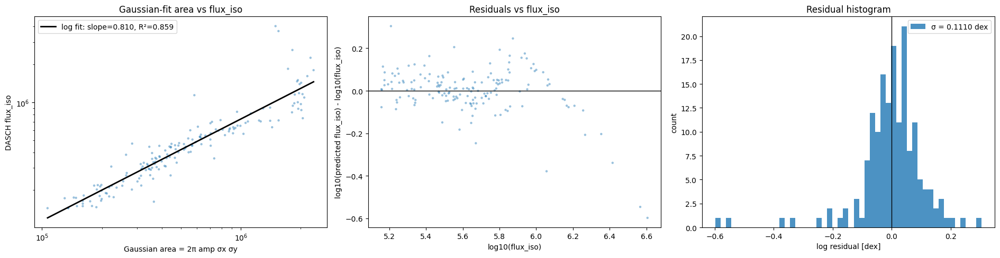

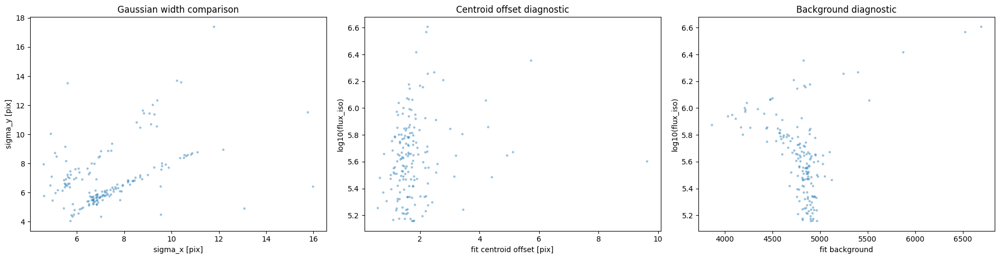

N successful fits: 164
log10(flux_iso) = 1.0089 + 0.8097 log10(gaussian_area)
R² = 0.8587
residual sigma = 0.1110 dex


In [22]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from scipy.optimize import curve_fit
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


def gaussian2d(coords, amp, x0, y0, sigma_x, sigma_y, theta, bg):
    x, y = coords
    ct = np.cos(theta)
    st = np.sin(theta)
    xp = (x - x0) * ct + (y - y0) * st
    yp = -(x - x0) * st + (y - y0) * ct
    return bg + amp * np.exp(-0.5 * ((xp / sigma_x) ** 2 + (yp / sigma_y) ** 2)).ravel()


def fit_gaussian_fluxes_vs_iso_flux(phot, fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz", half_size=10, max_sources=None, random_state=42, min_flux_iso=0, max_fit_sigma=20):
    x = np.asarray(phot["image_x"], dtype=float)
    y = np.asarray(phot["image_y"], dtype=float)
    flux_iso = np.asarray(phot["flux_iso"], dtype=float)

    good = np.isfinite(x) & np.isfinite(y) & np.isfinite(flux_iso) & (flux_iso > min_flux_iso)
    idx = np.where(good)[0]

    if max_sources is not None and len(idx) > max_sources:
        rng = np.random.default_rng(random_state)
        idx = rng.choice(idx, size=max_sources, replace=False)

    with fits.open(fits_path, memmap=True) as hdul:
        hdu = next(h for h in hdul if h.data is not None and np.squeeze(h.data).ndim == 2)
        image = np.squeeze(hdu.data)
        ny, nx = image.shape

        rows = []

        for k, i in enumerate(idx):
            xi = x[i]
            yi = y[i]

            xc = int(np.round(xi))
            yc = int(np.round(yi))

            x0 = max(0, xc - half_size)
            x1 = min(nx, xc + half_size + 1)
            y0 = max(0, yc - half_size)
            y1 = min(ny, yc + half_size + 1)

            if x1 - x0 < 5 or y1 - y0 < 5:
                continue

            cut = np.asarray(image[y0:y1, x0:x1], dtype=float)

            if not np.all(np.isfinite(cut)):
                finite_med = np.nanmedian(cut)
                cut = np.where(np.isfinite(cut), cut, finite_med)

            yy, xx = np.mgrid[y0:y1, x0:x1]

            bg0 = np.nanmedian(cut)
            amp0 = np.nanmax(cut) - bg0

            if not np.isfinite(amp0) or amp0 <= 0:
                continue

            sx0 = 2.0
            sy0 = 2.0
            theta0 = 0.0

            p0 = [amp0, xi, yi, sx0, sy0, theta0, bg0]

            lower = [0, x0, y0, 0.5, 0.5, -np.pi / 2, np.nanmin(cut) - abs(amp0)]
            upper = [np.inf, x1, y1, max_fit_sigma, max_fit_sigma, np.pi / 2, np.nanmax(cut) + abs(amp0)]

            try:
                popt, pcov = curve_fit(gaussian2d, (xx, yy), cut.ravel(), p0=p0, bounds=(lower, upper), maxfev=5000)
            except Exception:
                continue

            amp, gx, gy, sigma_x, sigma_y, theta, bg = popt

            if not np.isfinite(amp) or not np.isfinite(sigma_x) or not np.isfinite(sigma_y):
                continue

            gaussian_area = 2 * np.pi * amp * sigma_x * sigma_y

            rows.append({
                "row_index": i,
                "image_x": xi,
                "image_y": yi,
                "fit_x": gx,
                "fit_y": gy,
                "amp": amp,
                "sigma_x": sigma_x,
                "sigma_y": sigma_y,
                "theta": theta,
                "background_fit": bg,
                "gaussian_area": gaussian_area,
                "flux_iso": flux_iso[i],
                "fit_dx": gx - xi,
                "fit_dy": gy - yi,
                "fit_dr": np.hypot(gx - xi, gy - yi),
            })

            if (k + 1) % 250 == 0:
                print(f"attempted {k + 1} / {len(idx)}, successful fits = {len(rows)}")

    if len(rows) == 0:
        raise RuntimeError("No successful Gaussian fits")

    dtype = [(k, float) for k in rows[0].keys()]
    dtype[0] = ("row_index", int)
    result = np.array([tuple(r[k] for k, _ in dtype) for r in rows], dtype=dtype)

    gf = result["gaussian_area"]
    fi = result["flux_iso"]

    good_fit = np.isfinite(gf) & np.isfinite(fi) & (gf > 0) & (fi > 0)
    X = np.log10(gf[good_fit]).reshape(-1, 1)
    Y = np.log10(fi[good_fit])

    lin = LinearRegression()
    lin.fit(X, Y)
    Yhat = lin.predict(X)
    r2 = r2_score(Y, Yhat)
    resid = Yhat - Y

    fig, axes = plt.subplots(1, 3, figsize=(19, 5))

    ax = axes[0]
    ax.scatter(gf[good_fit], fi[good_fit], s=10, alpha=0.45, edgecolors="none")
    xx = np.logspace(np.nanmin(np.log10(gf[good_fit])), np.nanmax(np.log10(gf[good_fit])), 300)
    yy = 10 ** lin.predict(np.log10(xx).reshape(-1, 1))
    ax.plot(xx, yy, color="k", linewidth=2, label=f"log fit: slope={lin.coef_[0]:.3f}, R²={r2:.3f}")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("Gaussian area = 2π amp σx σy")
    ax.set_ylabel("DASCH flux_iso")
    ax.set_title("Gaussian-fit area vs flux_iso")
    ax.legend()

    ax = axes[1]
    ax.scatter(Y, resid, s=10, alpha=0.45, edgecolors="none")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel("log10(flux_iso)")
    ax.set_ylabel("log10(predicted flux_iso) - log10(flux_iso)")
    ax.set_title("Residuals vs flux_iso")

    ax = axes[2]
    r = resid[np.isfinite(resid)]
    ax.hist(r, bins=50, alpha=0.8, label=f"σ = {np.nanstd(r, ddof=1):.4f} dex")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("log residual [dex]")
    ax.set_ylabel("count")
    ax.set_title("Residual histogram")
    ax.legend()

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 3, figsize=(19, 5))

    ax = axes[0]
    ax.scatter(result["sigma_x"][good_fit], result["sigma_y"][good_fit], s=10, alpha=0.45, edgecolors="none")
    ax.set_xlabel("sigma_x [pix]")
    ax.set_ylabel("sigma_y [pix]")
    ax.set_title("Gaussian width comparison")

    ax = axes[1]
    ax.scatter(result["fit_dr"][good_fit], np.log10(fi[good_fit]), s=10, alpha=0.45, edgecolors="none")
    ax.set_xlabel("fit centroid offset [pix]")
    ax.set_ylabel("log10(flux_iso)")
    ax.set_title("Centroid offset diagnostic")

    ax = axes[2]
    ax.scatter(result["background_fit"][good_fit], np.log10(fi[good_fit]), s=10, alpha=0.45, edgecolors="none")
    ax.set_xlabel("fit background")
    ax.set_ylabel("log10(flux_iso)")
    ax.set_title("Background diagnostic")

    plt.tight_layout()
    plt.show()

    print(f"N successful fits: {len(result)}")
    print(f"log10(flux_iso) = {lin.intercept_:.4f} + {lin.coef_[0]:.4f} log10(gaussian_area)")
    print(f"R² = {r2:.4f}")
    print(f"residual sigma = {np.nanstd(resid, ddof=1):.4f} dex")

    return result, lin


gauss_fit_results, gauss_flux_model = fit_gaussian_fluxes_vs_iso_flux(phot, fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz", half_size=10, max_sources=2000)

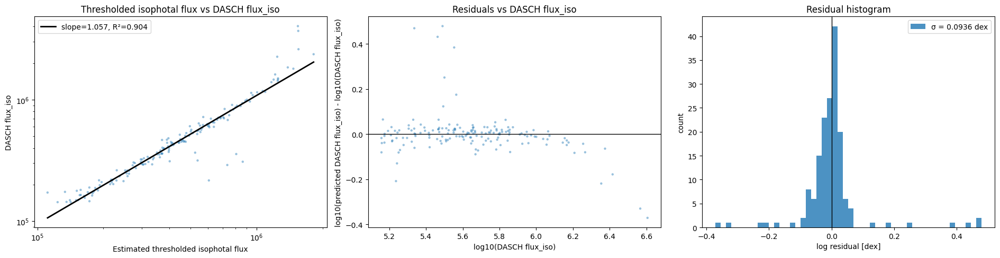

N successful estimates: 166
log10(DASCH flux_iso) = -0.3070 + 1.0571 log10(estimated_iso_flux)
R² = 0.9039
residual sigma = 0.0936 dex


In [23]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from scipy.ndimage import label, find_objects
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


def estimate_iso_flux_from_cutout(cut, cx, cy, thresh_sigma=1.5, bg_inner=None, bg_outer=None):
    yy, xx = np.mgrid[0:cut.shape[0], 0:cut.shape[1]]

    if bg_outer is None:
        bg_outer = 0.45 * min(cut.shape)

    rr = np.hypot(xx - cx, yy - cy)

    # Use outer part of cutout as local background estimate.
    bg_mask = rr >= bg_outer

    if bg_mask.sum() < 20:
        bg_mask = np.ones_like(cut, dtype=bool)

    bg = np.nanmedian(cut[bg_mask])
    sigma = 1.4826 * np.nanmedian(np.abs(cut[bg_mask] - bg))

    if not np.isfinite(sigma) or sigma <= 0:
        sigma = np.nanstd(cut[bg_mask])

    sub = cut - bg
    mask = sub > thresh_sigma * sigma

    # Keep only connected component containing/nearest source center.
    lab, nlab = label(mask)

    if nlab == 0:
        return np.nan, bg, sigma, 0

    icx = int(np.clip(round(cx), 0, cut.shape[1] - 1))
    icy = int(np.clip(round(cy), 0, cut.shape[0] - 1))
    source_label = lab[icy, icx]

    if source_label == 0:
        labels = np.arange(1, nlab + 1)
        centers = []
        for ell in labels:
            yy_l, xx_l = np.where(lab == ell)
            centers.append((ell, np.nanmean(xx_l), np.nanmean(yy_l)))
        source_label = min(centers, key=lambda t: (t[1] - cx) ** 2 + (t[2] - cy) ** 2)[0]

    source_mask = lab == source_label
    flux = np.nansum(sub[source_mask])
    area = np.count_nonzero(source_mask)

    return flux, bg, sigma, area


def compare_threshold_iso_flux_to_dasch(phot, fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz", half_size=20, thresh_sigma=1.5, max_sources=3000, random_state=42):
    x = np.asarray(phot["image_x"], dtype=float)
    y = np.asarray(phot["image_y"], dtype=float)
    flux_iso = np.asarray(phot["flux_iso"], dtype=float)

    good = np.isfinite(x) & np.isfinite(y) & np.isfinite(flux_iso) & (flux_iso > 0)
    idx = np.where(good)[0]

    if max_sources is not None and len(idx) > max_sources:
        rng = np.random.default_rng(random_state)
        idx = rng.choice(idx, size=max_sources, replace=False)

    rows = []

    with fits.open(fits_path, memmap=True) as hdul:
        hdu = next(h for h in hdul if h.data is not None and np.squeeze(h.data).ndim == 2)
        image = np.squeeze(hdu.data)
        ny, nx = image.shape

        for k, i in enumerate(idx):
            xi = x[i]
            yi = y[i]
            xc = int(round(xi))
            yc = int(round(yi))

            x0 = max(0, xc - half_size)
            x1 = min(nx, xc + half_size + 1)
            y0 = max(0, yc - half_size)
            y1 = min(ny, yc + half_size + 1)

            cut = np.asarray(image[y0:y1, x0:x1], dtype=float)

            if cut.shape[0] < 5 or cut.shape[1] < 5:
                continue

            cx = xi - x0
            cy = yi - y0

            est_flux, bg, sigma, area = estimate_iso_flux_from_cutout(cut, cx, cy, thresh_sigma=thresh_sigma)

            if np.isfinite(est_flux) and est_flux > 0:
                rows.append((i, xi, yi, est_flux, flux_iso[i], bg, sigma, area))

            if (k + 1) % 500 == 0:
                print(f"attempted {k + 1}/{len(idx)}, successful = {len(rows)}")

    result = np.array(rows, dtype=[("row_index", int), ("image_x", float), ("image_y", float), ("estimated_iso_flux", float), ("flux_iso", float), ("background", float), ("background_sigma", float), ("iso_area_pixels", int)])

    est = result["estimated_iso_flux"]
    dasch = result["flux_iso"]
    good_fit = np.isfinite(est) & np.isfinite(dasch) & (est > 0) & (dasch > 0)

    X = np.log10(est[good_fit]).reshape(-1, 1)
    Y = np.log10(dasch[good_fit])

    model = LinearRegression()
    model.fit(X, Y)
    pred = model.predict(X)
    resid = pred - Y

    fig, axes = plt.subplots(1, 3, figsize=(19, 5))

    ax = axes[0]
    ax.scatter(est[good_fit], dasch[good_fit], s=10, alpha=0.45, edgecolors="none")
    xx = np.logspace(np.nanmin(np.log10(est[good_fit])), np.nanmax(np.log10(est[good_fit])), 300)
    yy = 10 ** model.predict(np.log10(xx).reshape(-1, 1))
    ax.plot(xx, yy, color="k", linewidth=2, label=f"slope={model.coef_[0]:.3f}, R²={r2_score(Y, pred):.3f}")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("Estimated thresholded isophotal flux")
    ax.set_ylabel("DASCH flux_iso")
    ax.set_title(f"Thresholded isophotal flux vs DASCH flux_iso")
    ax.legend()

    ax = axes[1]
    ax.scatter(Y, resid, s=10, alpha=0.45, edgecolors="none")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel("log10(DASCH flux_iso)")
    ax.set_ylabel("log10(predicted DASCH flux_iso) - log10(DASCH flux_iso)")
    ax.set_title("Residuals vs DASCH flux_iso")

    ax = axes[2]
    r = resid[np.isfinite(resid)]
    ax.hist(r, bins=50, alpha=0.8, label=f"σ = {np.nanstd(r, ddof=1):.4f} dex")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("log residual [dex]")
    ax.set_ylabel("count")
    ax.set_title("Residual histogram")
    ax.legend()

    plt.tight_layout()
    plt.show()

    print(f"N successful estimates: {len(result)}")
    print(f"log10(DASCH flux_iso) = {model.intercept_:.4f} + {model.coef_[0]:.4f} log10(estimated_iso_flux)")
    print(f"R² = {r2_score(Y, pred):.4f}")
    print(f"residual sigma = {np.nanstd(resid, ddof=1):.4f} dex")

    return result, model


iso_estimates, iso_flux_model = compare_threshold_iso_flux_to_dasch(
    phot,
    fits_path="a03632_mosaic_00_01r180ww_tnx.fit.fz",
    half_size=20,
    thresh_sigma=1.5,
    max_sources=3000,
)

mag_iso = -0.000099 + -2.499981 log10(flux_iso)
Expected slope for magnitudes: -2.5
R² = 1.000000
residual σ = 0.000028 mag


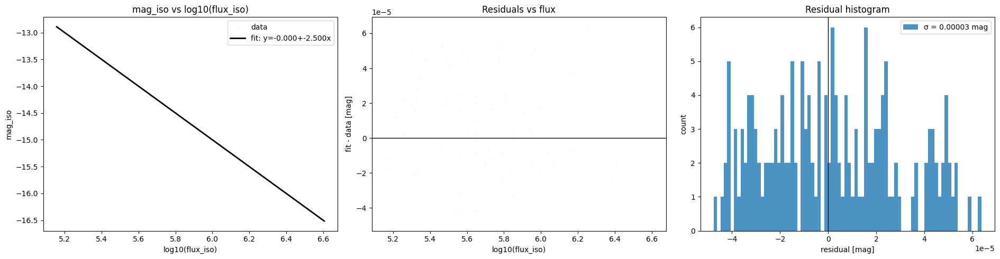

In [24]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.metrics import r2_score


def fit_flux_to_mag_iso(dfs, flux_col="flux_iso", mag_col="mag_iso", use_huber=True):
    flux = np.asarray(dfs[flux_col], dtype=float)
    mag = np.asarray(dfs[mag_col], dtype=float)

    good = np.isfinite(flux) & np.isfinite(mag) & (flux > 0)
    x = np.log10(flux[good]).reshape(-1, 1)
    y = mag[good]

    model = HuberRegressor(max_iter=2000) if use_huber else LinearRegression()
    model.fit(x, y)

    slope = model.coef_[0]
    intercept = model.intercept_
    pred = model.predict(x)
    resid = pred - y

    r2 = r2_score(y, pred)
    sigma = np.nanstd(resid, ddof=1)

    print(f"{mag_col} = {intercept:.6f} + {slope:.6f} log10({flux_col})")
    print(f"Expected slope for magnitudes: -2.5")
    print(f"R² = {r2:.6f}")
    print(f"residual σ = {sigma:.6f} mag")

    fig, axes = plt.subplots(1, 3, figsize=(19, 5))

    ax = axes[0]
    ax.scatter(x.ravel(), y, s=0.5, alpha=0.35, edgecolors="none", label="data")
    xx = np.linspace(np.nanmin(x), np.nanmax(x), 500)
    yy = model.predict(xx.reshape(-1, 1))
    ax.plot(xx, yy, color="k", linewidth=2, label=f"fit: y={intercept:.3f}+{slope:.3f}x")
    ax.set_xlabel(f"log10({flux_col})")
    ax.set_ylabel(mag_col)
    ax.set_title(f"{mag_col} vs log10({flux_col})")
    ax.legend()

    ax = axes[1]
    ax.scatter(x.ravel(), resid, s=0.5, alpha=0.35, edgecolors="none")
    ax.axhline(0, color="k", linewidth=1)
    ax.set_xlabel(f"log10({flux_col})")
    ax.set_ylabel("fit - data [mag]")
    ax.set_title("Residuals vs flux")

    ax = axes[2]
    r = resid[np.isfinite(resid)]
    ax.hist(r, bins=80, alpha=0.8, label=f"σ = {np.nanstd(r, ddof=1):.5f} mag")
    ax.axvline(0, color="k", linewidth=1)
    ax.set_xlabel("residual [mag]")
    ax.set_ylabel("count")
    ax.set_title("Residual histogram")
    ax.legend()

    plt.tight_layout()
    plt.show()

    return model


flux_to_magiso_model = fit_flux_to_mag_iso(dfs)

## Great that ones' tivial! Great!